# Imports

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [2]:
import os
os.chdir("/content/drive/MyDrive/mlproject")
!ls

dbscan_15_2_all_mini_l6v2.pickle
dbscan_15_2_all_minilm_l3v2.pickle
dbscan_15_2_all_mpnet_basev2.pickle
dbscan_17_2_all_mini_l6v2.pickle
dbscan_17_2_all_minilm_l3v2.pickle
dbscan_17_2_all_mpnet_basev2.pickle
dbscan_20_2_all_mini_l6v2.pickle
dbscan_20_2_all_minilm_l3v2.pickle
dbscan_20_2_all_mpnet_basev2.pickle
dbscan_25_2_all_mini_l6v2.pickle
dbscan_25_2_all_minilm_l3v2.pickle
dbscan_25_2_all_mpnet_basev2.pickle
DBSCAN.ipynb
dbscan_manhattan_150_2_all_minilm_l3v2.pickle
dbscan_manhattan_160_2_all_mini_l6v2.pickle
dbscan_manhattan_180_2_all_mini_l6v2.pickle
dbscan_manhattan_180_2_all_minilm_l3v2.pickle
dbscan_manhattan_250_2_all_mpnet_basev2.pickle
dbscan_manhattan_280_2_all_mpnet_basev2.pickle
gm_1001_all_mini_l6v2_.pickle
gm_1001_all_mini_l6v2_random_init.pickle
gm_1001_all_mpnet_basev2_.pickle
gm_800_all_mini_l6v2.pickle
gm_800_all_mini_l6v2_random_init.pickle
gm_800_all_mpnet_basev2.pickle
gm_800_all_mpnet_basev2_random_init.pickle
test_set_final_all_minilm_l3v2.tsv
test_set_final_a

In [ ]:
!pip install sentence_transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 85 kB 2.9 MB/s 
     |████████████████████████████████| 5.8 MB 31.0 MB/s 
     |████████████████████████████████| 1.3 MB 40.8 MB/s 
     |████████████████████████████████| 182 kB 54.5 MB/s 
     |████████████████████████████████| 7.6 MB 28.5 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125938 sha256=09181ed581bcad62ff7820d78d75bf08deefe8c6c366a5fc2e8233fefcf361c4
  Stored in directory: /root/.cache/pip/wheels/5e/6f/8c/d88aec621f3f542d26fac0342bef5e693335d125f4e54aeffe
Successfully built sentence-transformers


In [5]:
#NLP 
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
from spacy.lang.en import English

import string

from multiprocessing import  Pool
import numpy as np
import pandas as pd

#from sentence_transformers import SentenceTransformer
#from sentence_transformers import util
import tensorflow as tf
from sklearn.preprocessing import StandardScaler

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.mixture import GaussianMixture
import pickle


/usr/local/lib/python3.8/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


In [ ]:
#read data from .tsv files
import pandas as pd
df_all_authors = pd.read_csv("all_authors.tsv", sep='\t', encoding= 'ISO-8859-1')
df_all_publications = pd.read_csv("all_publications.tsv", sep='\t')
df_selected_author_publications = pd.read_csv("selected_author_publications_information.tsv", sep='\t')
df_selected_publication_citations = pd.read_csv("selected_publication_citations_information.tsv", sep='\t')

In [ ]:
# Drop duplicates
df_all_publications.drop_duplicates(inplace=True)
df_selected_publication_citations.drop_duplicates(inplace=True)

# Drop NA's
#
print(df_all_publications.isna().sum())
print(df_selected_publication_citations.isna().sum())
df_selected_publication_citations.drop(['citation_sentence_cited'], axis=1, inplace=True)
df_all_publications.dropna(inplace=True)
print(df_all_publications.isna().sum())

paper_id                         0
paper_dblp_key                   0
paper_title                      0
paper_filtered_title             0
paper_published_date             0
paper_published_conference       0
paper_gscholar_url               0
paper_dblp_url                   0
paper_abstract                2529
dtype: int64
citing_paper_id                   0
cited_paper_id                    0
citation_title                    0
citation_filtered_title           0
citation_sentence_before       3843
citation_sentence_cited          25
citation_sentence_after        3391
citation_position (section)       0
dtype: int64
paper_id                      0
paper_dblp_key                0
paper_title                   0
paper_filtered_title          0
paper_published_date          0
paper_published_conference    0
paper_gscholar_url            0
paper_dblp_url                0
paper_abstract                0
dtype: int64


In [ ]:
titles    = []
abstracts = []
confs      = []
citeds    = []
cited_confs = []
cited_abs = []

for cited_idx, title in enumerate(df_selected_publication_citations['citation_filtered_title']):
    paper_id_found = False
    cited_paper_id = df_selected_publication_citations['cited_paper_id'].iloc[cited_idx]   
    paper_id = df_selected_publication_citations["citing_paper_id"].iloc[cited_idx]

    # All publications has not contain paper information for paper_id = 5835
    try:
        citeds.append(title)
        titles.append(df_all_publications['paper_title'].iloc[df_all_publications.index[df_all_publications['paper_id'] == paper_id].tolist()[0]])
        abstracts.append(df_all_publications['paper_abstract'].iloc[df_all_publications.index[df_all_publications['paper_id'] == paper_id].tolist()[0]])
        confs.append(df_all_publications['paper_published_conference'].iloc[df_all_publications.index[df_all_publications['paper_id'] == paper_id].tolist()[0]])
        paper_id_found = True
        cited_confs.append(df_all_publications['paper_published_conference'].iloc[df_all_publications.index[df_all_publications['paper_id'] == cited_paper_id].tolist()[0]])
        cited_abs.append(df_all_publications['paper_abstract'].iloc[df_all_publications.index[df_all_publications['paper_id'] == cited_paper_id].tolist()[0]])
    except:
        if paper_id_found:
            titles.pop()
            abstracts.pop()
            confs.pop()
            citeds.pop()
        continue

In [ ]:
headers = ['paper_title', 'paper_abstract', 'paper_published_conference', 'cited_paper_title', 'cited_paper_published_conference', 'cited_paper_abstract']
df = pd.DataFrame(list(zip(titles, abstracts, confs, citeds, cited_confs, cited_abs)),
               columns = headers)

df['paper_abstract'] = df['paper_abstract'].astype(str).map(lambda x: x.lstrip('[').rstrip(']'))
df['cited_paper_abstract'] = df['cited_paper_abstract'].astype(str).map(lambda x: x.lstrip('[').rstrip(']'))

train_set = df.sample(frac = 0.7)
test_set  = df.drop(train_set.index)

# Check the ratio
print(df.shape)
print(train_set.shape[0] / df.shape[0])
print(test_set.shape[0] / df.shape[0])

df.head(5)
train_set.head(5)

In [ ]:
train_set.to_csv("train_set.tsv", sep='\t')
test_set.to_csv("test_set.tsv", sep='\t')

In [ ]:
punctuations = string.punctuation
stopwords = list(STOP_WORDS)
stopwords[:10]

custom_stop_words = [
    'doi', 'preprint', 'copyright', 'peer', 'reviewed', 'org', 'https', 'et', 'al', 'author', 'figure', 
    'rights', 'reserved', 'permission', 'used', 'using', 'biorxiv', 'medrxiv', 'license', 'fig', 'fig.', 
    'al.', 'Elsevier', 'PMC', 'CZI', 'www'
]

for w in custom_stop_words:
    if w not in stopwords:
        stopwords.append(w)

print(len(stopwords))

350


In [ ]:
parser = spacy.load("en_core_web_sm")
parser.max_length = 7000000

def call_tokenizer(df):
    df["paper_abstract"] = df["paper_abstract"].apply(spacy_tokenizer)
    #df["processed_cited_paper_abstract"] = df["cited_paper_abstract"].apply(spacy_tokenizer)
    return df

def spacy_tokenizer(sentence):
    mytokens = parser(sentence)
    mytokens = [ word.lemma_.lower().strip() if word.lemma_ != "-PRON-" else word.lower_ for word in mytokens ]
    mytokens = [ word for word in mytokens if word not in stopwords and word not in punctuations ]
    mytokens = " ".join([i for i in mytokens])
    return mytokens

In [ ]:
def parallelize_dataframe(df, func, n_cores=4):
    df_split = np.array_split(df, n_cores)
    pool = Pool(n_cores)
    df = pd.concat(pool.map(func, df_split))
    pool.close()
    pool.join()
    return df

In [ ]:
loaded_train_set = pd.read_csv("train_set.tsv", sep='\t')
loaded_test_set = pd.read_csv("test_set.tsv", sep='\t')

In [ ]:
loaded_train_set.drop(columns = 'Unnamed: 0', axis = 1, inplace= True)
print(loaded_train_set.shape)
loaded_train_set.head(5)
loaded_train_set.drop(columns = 'cited_paper_title', axis = 1, inplace= True)
loaded_train_set.drop(columns = 'cited_paper_published_conference', axis = 1, inplace= True)
loaded_train_set.drop(columns = 'cited_paper_abstract', axis = 1, inplace= True)
loaded_train_set.drop(columns = 'paper_published_conference', axis = 1, inplace= True)
loaded_train_set.drop(columns = 'paper_title', axis = 1, inplace= True)
loaded_train_set.to_csv('train_set_1_feat.tsv', sep="\t")

(7220, 6)


In [ ]:
loaded_train_set.head()

,paper_abstract
0,Difference rewards and potential-based reward ...
1,Network virtualization can eradicate the ossif...
2,Algorithmic mechanism design considers distrib...
3,Chemical composition of interfaces-free surfac...
4,Efficient evaluation of spatial queries is an ...


In [ ]:
%time loaded_train_set = parallelize_dataframe(df=loaded_train_set, func=call_tokenizer, n_cores=50)

CPU times: user 1.73 s, sys: 3.02 s, total: 4.74 s
Wall time: 4min 14s


In [ ]:
loaded_test_set.drop(columns = 'Unnamed: 0', axis = 1, inplace= True)
print(loaded_test_set.shape)
loaded_test_set.head(5)
loaded_test_set.drop(columns = 'cited_paper_title', axis = 1, inplace= True)
loaded_test_set.drop(columns = 'cited_paper_published_conference', axis = 1, inplace= True)
loaded_test_set.drop(columns = 'cited_paper_abstract', axis = 1, inplace= True)
loaded_test_set.drop(columns = 'paper_published_conference', axis = 1, inplace= True)
loaded_test_set.drop(columns = 'paper_title', axis = 1, inplace= True)
loaded_test_set.to_csv('test_set_1_feat.tsv', sep="\t")
print(loaded_test_set.shape)
loaded_test_set.head(5)

(3095, 6)
(3095, 1)


,paper_abstract
0,In this article we propose a framework that ge...
1,Conversational Recommender Systems (CoRSs) imp...
2,Conversational Recommender Systems (CoRSs) imp...
3,"In this pa, per we present HealthNet (HN), a s..."
4,"In the Internet of Things, smart devices are c..."


# TEXT TO VEC

In [ ]:
model_1 = SentenceTransformer('all-MiniLM-L6-v2')
model_2 = SentenceTransformer('all-mpnet-base-v2')
model_3 = SentenceTransformer('paraphrase-MiniLM-L3-v2')



#For other pre-trained models, please check link below:
#https://www.sbert.net/docs/pretrained_models.html

# For other columns
#title_embedding = model.encode(loaded_train_set["paper_title"])
#conf_embedding = model.encode(loaded_train_set["paper_published_conference"])
#cited_title_embedding = model.encode(loaded_train_set["cited_paper_title"])
#cited_conf_embedding = model.encode(loaded_train_set["cited_paper_published_conference"])
#cited_abs_embedding = model.encode(loaded_train_set["cited_paper_abstract"])

# For paper abstracts

# Model : all-MiniLM-L6-v2
abs_embedding_train_all_mini_l6v2 = model_1.encode(loaded_train_set["paper_abstract"])
print(abs_embedding_train_all_mini_l6v2.shape)

# Model : all-mpnet-base-v2
abs_embedding_train_all_mpnet_basev2 = model_2.encode(loaded_train_set["paper_abstract"])
print(abs_embedding_train_all_mpnet_basev2.shape)

#Model : paraphrase-MiniLM-L3-v2
abs_embedding_train_all_minilm_l3v2 = model_3.encode(loaded_train_set["paper_abstract"])
print(abs_embedding_train_all_minilm_l3v2.shape)

(7220, 384)
(7220, 768)
(7220, 384)


In [ ]:
model_1 = SentenceTransformer('all-MiniLM-L6-v2')
model_2 = SentenceTransformer('all-mpnet-base-v2')
model_3 = SentenceTransformer('paraphrase-MiniLM-L3-v2')
# For other columns
#title_embedding = model.encode(loaded_test_set["paper_title"])
#conf_embedding = model.encode(loaded_test_set["paper_published_conference"])
#cited_title_embedding = model.encode(loaded_test_set["cited_paper_title"])
#cited_conf_embedding = model.encode(loaded_test_set["cited_paper_published_conference"])
#cited_abs_embedding = model.encode(loaded_test_set["cited_paper_abstract"])

# For paper abstracts

# Model : all-MiniLM-L6-v2
abs_embedding_test_all_mini_l6v2 = model_1.encode(loaded_test_set["paper_abstract"])
print(abs_embedding_test_all_mini_l6v2.shape)

# Model : all-mpnet-base-v2
abs_embedding_test_all_mpnet_basev2 = model_2.encode(loaded_test_set["paper_abstract"])
print(abs_embedding_test_all_mpnet_basev2.shape)

#Model : paraphrase-MiniLM-L3-v2
abs_embedding_test_all_minilm_l3v2 = model_3.encode(loaded_test_set["paper_abstract"])
print(abs_embedding_test_all_minilm_l3v2.shape)

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/612 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/350 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/571 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/438M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/239 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/363 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/690 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.01k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/629 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/69.6M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/314 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

(3095, 384)
(3095, 768)
(3095, 384)


In [ ]:
#define scaler
scaler = StandardScaler()

scaled_train_set_all_mini_l6v2=pd.DataFrame(scaler.fit_transform(abs_embedding_train_all_mini_l6v2))
print(scaled_train_set_all_mini_l6v2.shape)

scaled_train_set_all_mpnet_basev2=pd.DataFrame(scaler.fit_transform(abs_embedding_train_all_mpnet_basev2))
print(scaled_train_set_all_mpnet_basev2.shape)

scaled_train_set_all_minilm_l3v2=pd.DataFrame(scaler.fit_transform(abs_embedding_train_all_minilm_l3v2))
print(scaled_train_set_all_minilm_l3v2.shape)

(7220, 384)
(7220, 768)
(7220, 384)


In [ ]:
#define scaler
scaler = StandardScaler()
scaled_test_set_all_mini_l6v2=pd.DataFrame(scaler.fit_transform(abs_embedding_test_all_mini_l6v2))
print(scaled_test_set_all_mini_l6v2.shape)


scaled_test_set_all_mpnet_basev2=pd.DataFrame(scaler.fit_transform(abs_embedding_test_all_mpnet_basev2))
print(scaled_test_set_all_mpnet_basev2.shape)


scaled_test_set_all_minilm_l3v2=pd.DataFrame(scaler.fit_transform(abs_embedding_test_all_minilm_l3v2))
print(scaled_test_set_all_minilm_l3v2.shape)


(3095, 384)
(3095, 768)
(3095, 384)


# Model : all-MiniLM-L6-v2

In [ ]:
pca_all_mini_l6v2 = PCA()
pca_result_all_mini_l6v2 = pca_all_mini_l6v2.fit_transform((scaled_train_set_all_mini_l6v2))
print('Cumulative variance explained by principal components: {:.2%}'.format(np.sum(pca_all_mini_l6v2.explained_variance_ratio_)))
n_pcs= pca_all_mini_l6v2.components_.shape[0]
print("Number of principal components : {}". format(n_pcs))
print("Shape of principal components : {}". format(pca_all_mini_l6v2.components_.shape))

Cumulative variance explained by principal components: 100.00%
Number of principal components : 384
Shape of principal components : (384, 384)


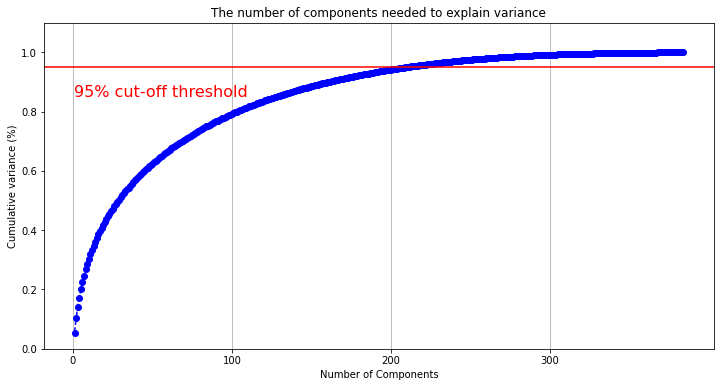

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, n_pcs+1, step=1)
y = np.cumsum(pca_all_mini_l6v2.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, n_pcs, step=100)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

In [ ]:
pca_all_mini_l6v2 = PCA(n_components=0.95)
principalComponents_all_mini_l6v2 = pca_all_mini_l6v2.fit_transform(scaled_train_set_all_mini_l6v2)
principalComponents_all_mini_l6v2.shape

(7220, 211)

In [4]:
#pd.DataFrame(principalComponents_all_mini_l6v2).to_csv("train_set_final_all-MiniLM-L6-v2.tsv", sep='\t')
principalComponents_all_mini_l6v2 = pd.read_csv("train_set_final_all-MiniLM-L6-v2.tsv", sep='\t')
principalComponents_all_mini_l6v2.drop(columns = 'Unnamed: 0', axis = 1, inplace= True)
principalComponents_all_mini_l6v2.shape

(7220, 203)

In [5]:
#principalComponents_all_mini_l6v2_test = pca_all_mini_l6v2.transform(scaled_test_set_all_mini_l6v2)
#pd.DataFrame(principalComponents_all_mini_l6v2_test).to_csv("test_set_final_all-MiniLM-L6-v2.tsv", sep='\t')
principalComponents_all_mini_l6v2_test = pd.read_csv("test_set_final_all-MiniLM-L6-v2.tsv", sep='\t')
principalComponents_all_mini_l6v2_test.drop(columns = 'Unnamed: 0', axis = 1, inplace= True)
principalComponents_all_mini_l6v2_test.shape

(3095, 203)

# Model : all-mpnet-base-v2

In [ ]:
pca_all_mpnet_basev2 = PCA()
pca_result_all_mpnet_basev2 = pca_all_mpnet_basev2.fit_transform((scaled_train_set_all_mpnet_basev2))
print('Cumulative variance explained by principal components: {:.2%}'.format(np.sum(pca_all_mpnet_basev2.explained_variance_ratio_)))
n_pcs= pca_all_mpnet_basev2.components_.shape[0]
print("Number of principal components : {}". format(n_pcs))
print("Shape of principal components : {}". format(pca_all_mpnet_basev2.components_.shape))

Cumulative variance explained by principal components: 100.00%
Number of principal components : 768
Shape of principal components : (768, 768)


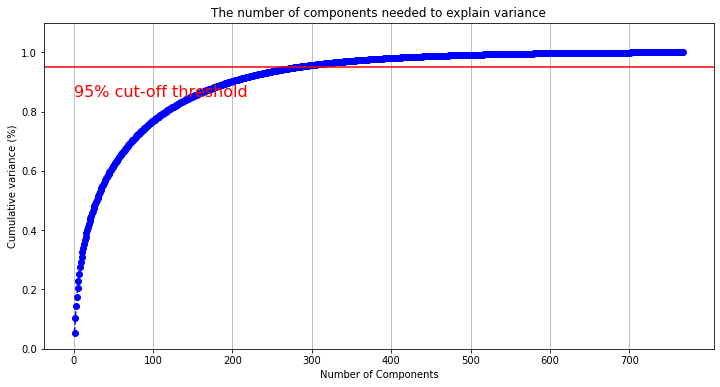

In [ ]:
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, n_pcs+1, step=1)
y = np.cumsum(pca_all_mpnet_basev2.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, n_pcs, step=100)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

In [ ]:
pca_all_mpnet_basev2 = PCA(n_components=0.95)
principalComponents_all_mpnet_basev2 = pca_all_mpnet_basev2.fit_transform(scaled_train_set_all_mpnet_basev2)
principalComponents_all_mpnet_basev2.shape

(7220, 282)

In [6]:
#pd.DataFrame(principalComponents_all_mpnet_basev2).to_csv("train_set_final_all_mpnet_basev2.tsv", sep='\t')
principalComponents_all_mpnet_basev2 = pd.read_csv("train_set_final_all_mpnet_basev2.tsv", sep='\t')
principalComponents_all_mpnet_basev2.drop(columns = 'Unnamed: 0', axis = 1, inplace= True)
principalComponents_all_mpnet_basev2.shape

(7220, 274)

In [7]:
#principalComponents_all_mpnet_basev2_test = pca_all_mpnet_basev2.transform(scaled_test_set_all_mpnet_basev2)
#pd.DataFrame(principalComponents_all_mpnet_basev2_test).to_csv("test_set_final_all_mpnet_basev2.tsv", sep='\t')
principalComponents_all_mpnet_basev2_test = pd.read_csv("test_set_final_all_mpnet_basev2.tsv", sep='\t')
principalComponents_all_mpnet_basev2_test.drop(columns = 'Unnamed: 0', axis = 1, inplace= True)
principalComponents_all_mpnet_basev2_test.shape

(3095, 274)

# Model : paraphrase-MiniLM-L3-v2

In [ ]:
pca_all_minilm_l3v2 = PCA()
pca_result_all_minilm_l3v2 = pca_all_minilm_l3v2.fit_transform((scaled_train_set_all_minilm_l3v2))
print('Cumulative variance explained by principal components: {:.2%}'.format(np.sum(pca_all_minilm_l3v2.explained_variance_ratio_)))
n_pcs= pca_all_minilm_l3v2.components_.shape[0]
print("Number of principal components : {}". format(n_pcs))
print("Shape of principal components : {}". format(pca_all_minilm_l3v2.components_.shape))

Cumulative variance explained by principal components: 100.00%
Number of principal components : 384
Shape of principal components : (384, 384)


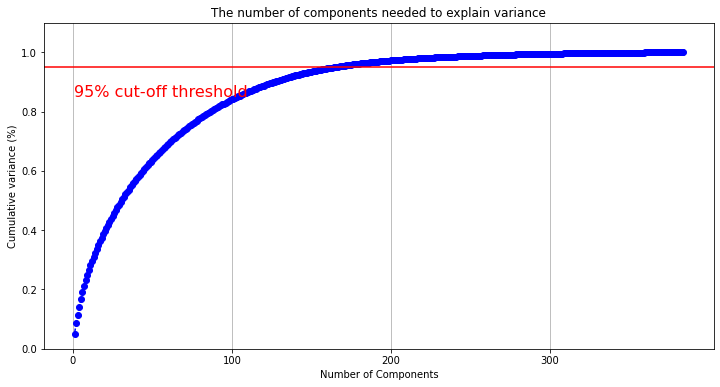

In [ ]:
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, n_pcs+1, step=1)
y = np.cumsum(pca_all_minilm_l3v2.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, n_pcs, step=100)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

In [ ]:
pca_all_minilm_l3v2 = PCA(n_components=0.95)
principalComponents_all_minilm_l3v2 = pca_all_minilm_l3v2.fit_transform(scaled_train_set_all_minilm_l3v2)
principalComponents_all_minilm_l3v2.shape

(7220, 165)

In [8]:
#pd.DataFrame(principalComponents_all_minilm_l3v2).to_csv("train_set_final_all_minilm_l3v2.tsv", sep='\t')
principalComponents_all_minilm_l3v2 = pd.read_csv("train_set_final_all_minilm_l3v2.tsv", sep='\t')
principalComponents_all_minilm_l3v2.drop(columns = 'Unnamed: 0', axis = 1, inplace= True)
principalComponents_all_minilm_l3v2.shape

(7220, 171)

In [9]:
#principalComponents_all_minilm_l3v2_test = pca_all_minilm_l3v2.transform(scaled_test_set_all_minilm_l3v2)
#pd.DataFrame(principalComponents_all_minilm_l3v2_test).to_csv("test_set_final_all_minilm_l3v2.tsv", sep='\t')
principalComponents_all_minilm_l3v2_test = pd.read_csv("test_set_final_all_minilm_l3v2.tsv", sep='\t')
principalComponents_all_minilm_l3v2_test.drop(columns = 'Unnamed: 0', axis = 1, inplace= True)
principalComponents_all_minilm_l3v2_test.shape

(3095, 171)

# Clustering

## DBSCAN

In [10]:
def dbscan_predict(model, X):
    nr_samples = X.shape[0]
    y_new = np.ones(shape=nr_samples, dtype=int) * -1
    for i in range(nr_samples):
        diff = model.components_ - list(X.iloc[i, :])  # NumPy broadcasting
        dist = np.linalg.norm(diff, axis=1)  # Euclidean distance

        shortest_dist_idx = np.argmin(dist)

        if dist[shortest_dist_idx] < model.eps:
            y_new[i] = model.labels_[model.core_sample_indices_[shortest_dist_idx]]

    return y_new

In [11]:
def dbscan_predict_manhattan(model, X):
  nr_samples = X.shape[0]
  y_new = np.ones(shape=nr_samples, dtype=int) * -1
  for i in range(nr_samples):
    
    diff = abs(model.components_ - list(X.iloc[i, :]))  # NumPy broadcasting
    dist = np.ones(shape=diff.shape[0], dtype=float) 
    for j in range(diff.shape[0]):
      dist[j] = sum(diff[i,:]) 
    shortest_dist_idx = np.argmin(dist)
    
    if dist[shortest_dist_idx] < model.eps:
      y_new[i] = model.labels_[model.core_sample_indices_[shortest_dist_idx]]
  return y_new

### Model : all-MiniLM-L6-v2

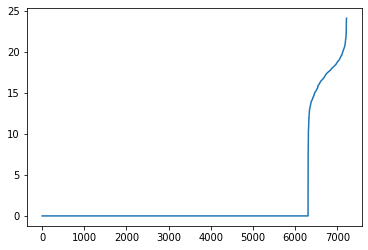

In [12]:
#https://stats.stackexchange.com/questions/406587/determining-epsilon-for-dbscan
#https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

neigh = NearestNeighbors(n_neighbors=2, metric='euclidean')
nbrs = neigh.fit(principalComponents_all_mini_l6v2)
distances, indices = nbrs.kneighbors(principalComponents_all_mini_l6v2)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [13]:
DBSCAN_cluster_all_mini_l6v2 = DBSCAN(eps=17, min_samples=2).fit(principalComponents_all_mini_l6v2) 
labels = dbscan_predict(DBSCAN_cluster_all_mini_l6v2, principalComponents_all_mini_l6v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,DBSCAN_cluster_all_mini_l6v2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2, DBSCAN_cluster_all_mini_l6v2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  16.736419875946414
silhouette score of model on train data:  0.5432052470672482


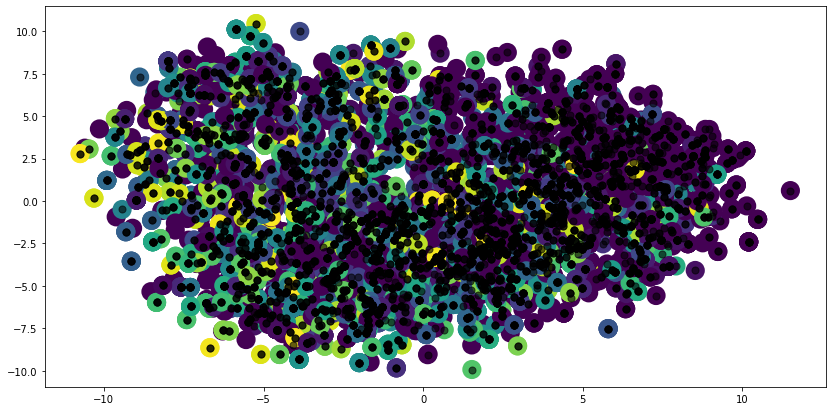

In [14]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=DBSCAN_cluster_all_mini_l6v2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [15]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mini_l6v2.labels_)))

Number of cluster:  971


In [16]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels, metric='euclidean'))

calinski harabasz score of model on test data:  6.338013574958187
silhouette score of model on test data:  0.3696047093459498


In [17]:
print("Number of cluster: ",len(np.unique(labels)))

Number of cluster:  694


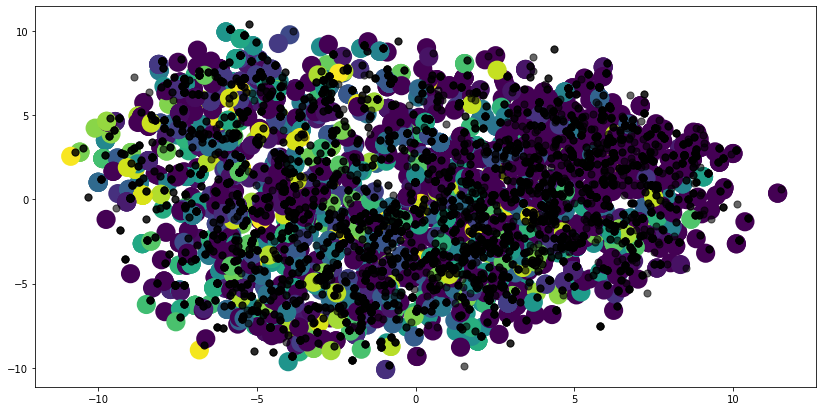

In [18]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [19]:
with open('dbscan_17_2_all_mini_l6v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mini_l6v2, f)

In [21]:
DBSCAN_cluster_all_mini_l6v2_2 = DBSCAN(eps=20, min_samples=2).fit(principalComponents_all_mini_l6v2) 
labels_2 = dbscan_predict(DBSCAN_cluster_all_mini_l6v2_2, principalComponents_all_mini_l6v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,DBSCAN_cluster_all_mini_l6v2_2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2, DBSCAN_cluster_all_mini_l6v2_2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  7.03575331322747
silhouette score of model on train data:  -0.00417296868725773


In [22]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mini_l6v2_2.labels_)))

Number of cluster:  190


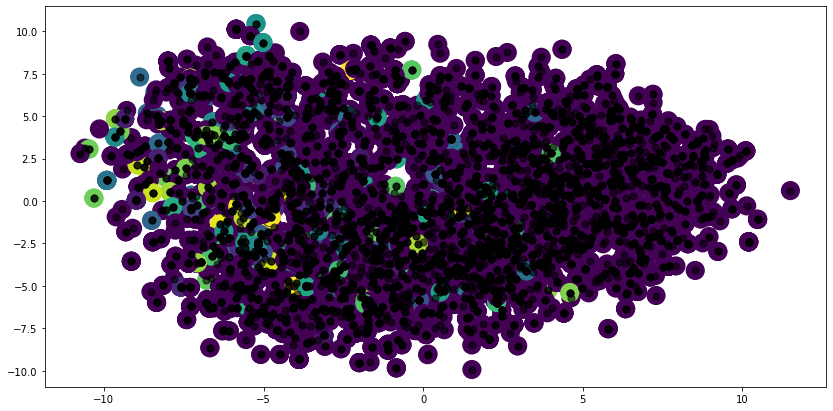

In [23]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=DBSCAN_cluster_all_mini_l6v2_2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [24]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels_2 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels_2, metric='euclidean'))

calinski harabasz score of model on test data:  3.9037939911960087
silhouette score of model on test data:  -0.016898660713074998


In [25]:
print("Number of cluster: ",len(np.unique(labels_2)))

Number of cluster:  132


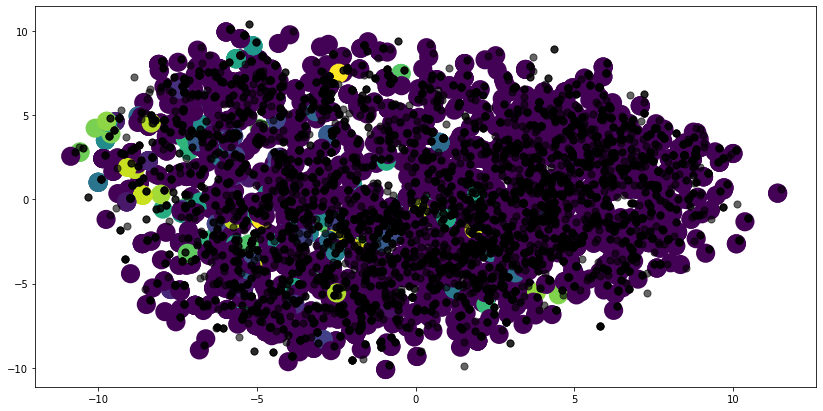

In [26]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels_2 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [27]:
with open('dbscan_20_2_all_mini_l6v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mini_l6v2_2, f)

In [28]:
DBSCAN_cluster_all_mini_l6v2_3 = DBSCAN(eps=15, min_samples=2).fit(principalComponents_all_mini_l6v2) 
labels_3 = dbscan_predict(DBSCAN_cluster_all_mini_l6v2_3, principalComponents_all_mini_l6v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,DBSCAN_cluster_all_mini_l6v2_3.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2, DBSCAN_cluster_all_mini_l6v2_3.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  30.129539749127403
silhouette score of model on train data:  0.7703124719840885


In [29]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mini_l6v2_3.labels_)))

Number of cluster:  1276


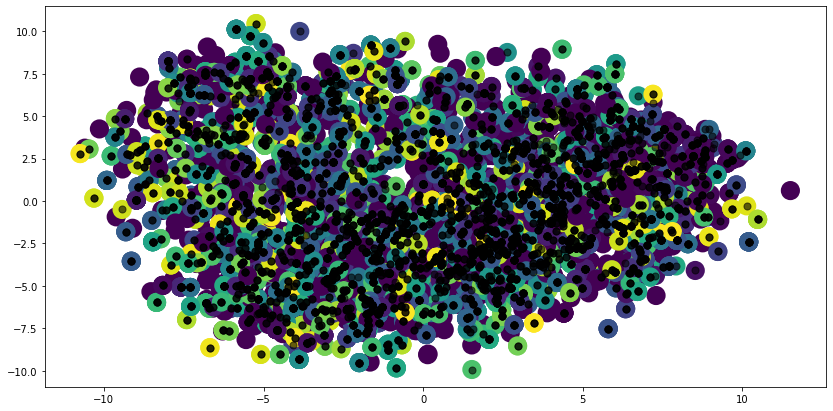

In [30]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=DBSCAN_cluster_all_mini_l6v2_3.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [31]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels_3 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels_3, metric='euclidean'))

calinski harabasz score of model on test data:  8.060910708033175
silhouette score of model on test data:  0.5312754394089961


In [32]:
print("Number of cluster: ",len(np.unique(labels_3)))

Number of cluster:  888


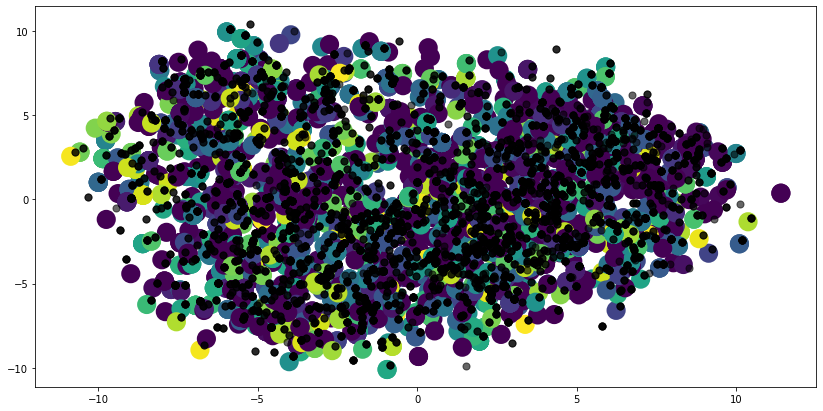

In [33]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels_3 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [34]:
with open('dbscan_15_2_all_mini_l6v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mini_l6v2_3, f)

In [35]:
DBSCAN_cluster_all_mini_l6v2_4 = DBSCAN(eps=25, min_samples=2).fit(principalComponents_all_mini_l6v2) 
labels_4 = dbscan_predict(DBSCAN_cluster_all_mini_l6v2_4, principalComponents_all_mini_l6v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mini_l6v2_4.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mini_l6v2_4.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  9.696910828665903
silhouette score of model on train data:  0.053186734412660294


In [36]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mini_l6v2_4.labels_)))

Number of cluster:  6


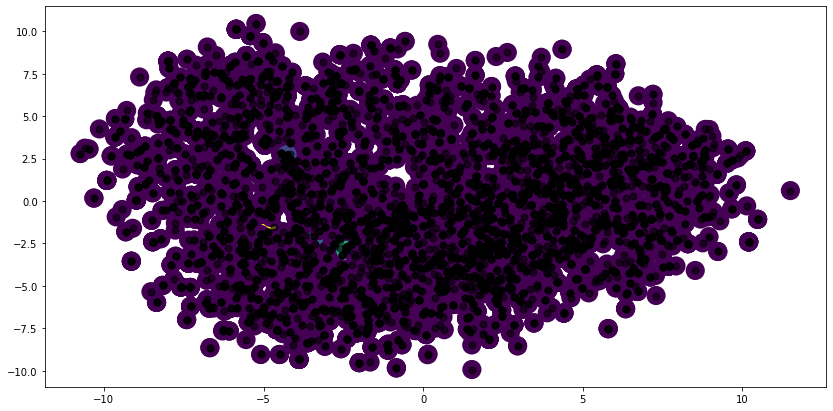

In [37]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=DBSCAN_cluster_all_mini_l6v2_4.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_4.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [38]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels_4 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels_4, metric='euclidean'))

calinski harabasz score of model on test data:  5.039781948286791
silhouette score of model on test data:  0.10388479036615765


In [39]:
print("Number of cluster: ",len(np.unique(labels_4)))

Number of cluster:  5


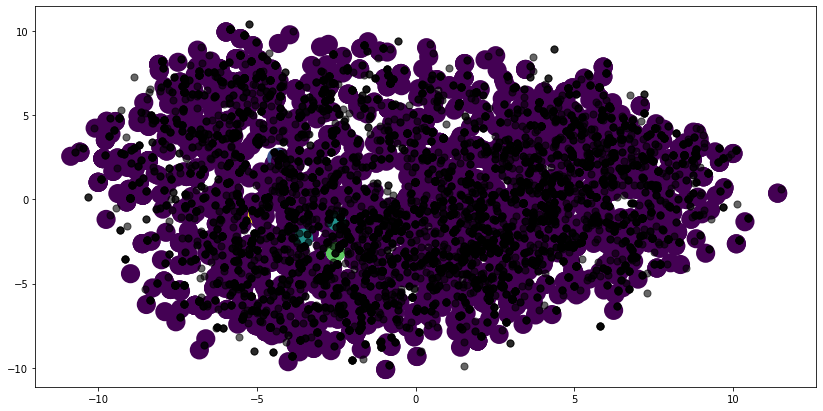

In [40]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels_4 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_4.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [41]:
with open('dbscan_25_2_all_mini_l6v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mini_l6v2_4, f)

In [42]:
for i in range(2,10):
  DBSCAN_cluster_all_mini_l6v2_min_samp = DBSCAN(eps=15, min_samples=i).fit(principalComponents_all_mini_l6v2) 
  print("calinski harabasz score of model with min_samples as {min}: {ch} ".format(min=i, ch= metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,DBSCAN_cluster_all_mini_l6v2_min_samp.labels_ )) )
  print("silhouette score of model with min_samples as {min}: {ss}".format(min = i, ss= metrics.silhouette_score(principalComponents_all_mini_l6v2, DBSCAN_cluster_all_mini_l6v2_min_samp.labels_ , metric='euclidean')) )


calinski harabasz score of model with min_samples as 2: 30.129539749127403 
silhouette score of model with min_samples as 2: 0.7703124719840885
calinski harabasz score of model with min_samples as 3: 22.454867503237388 
silhouette score of model with min_samples as 3: 0.6256621827365957
calinski harabasz score of model with min_samples as 4: 20.33100398129579 
silhouette score of model with min_samples as 4: 0.5053285910008257
calinski harabasz score of model with min_samples as 5: 19.346203724048543 
silhouette score of model with min_samples as 5: 0.40577838521092546
calinski harabasz score of model with min_samples as 6: 19.104425032896003 
silhouette score of model with min_samples as 6: 0.3188507670243667
calinski harabasz score of model with min_samples as 7: 19.172388550558896 
silhouette score of model with min_samples as 7: 0.2397504074641582
calinski harabasz score of model with min_samples as 8: 19.62404439914308 
silhouette score of model with min_samples as 8: 0.1682815385

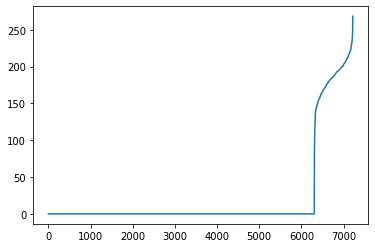

In [43]:
#https://stats.stackexchange.com/questions/406587/determining-epsilon-for-dbscan
#https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

neigh = NearestNeighbors(n_neighbors=2, metric='manhattan')
nbrs = neigh.fit(principalComponents_all_mini_l6v2)
distances, indices = nbrs.kneighbors(principalComponents_all_mini_l6v2)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [44]:
DBSCAN_cluster_all_mini_l6v2_manhattan= DBSCAN(eps=180, min_samples=2, metric="manhattan").fit(principalComponents_all_mini_l6v2) 
labels_manhattan = dbscan_predict_manhattan(DBSCAN_cluster_all_mini_l6v2_manhattan, principalComponents_all_mini_l6v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,DBSCAN_cluster_all_mini_l6v2_manhattan.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2, DBSCAN_cluster_all_mini_l6v2_manhattan.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  15.056002803864542
silhouette score of model on train data:  0.5371209006503883


In [45]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mini_l6v2_manhattan.labels_)))

Number of cluster:  997


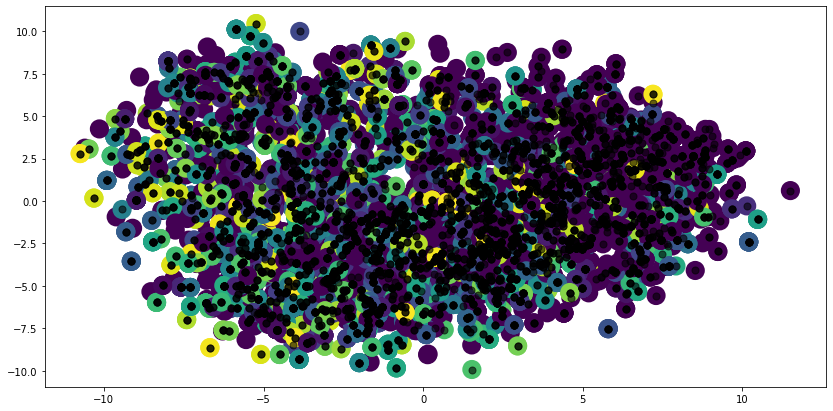

In [46]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=DBSCAN_cluster_all_mini_l6v2_manhattan.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_manhattan.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [47]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels_manhattan ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels_manhattan, metric='euclidean'))

calinski harabasz score of model on test data:  0.7462093636170107
silhouette score of model on test data:  -0.017792531620757543


In [48]:
print("Number of cluster: ",len(np.unique(labels_manhattan)))

Number of cluster:  2


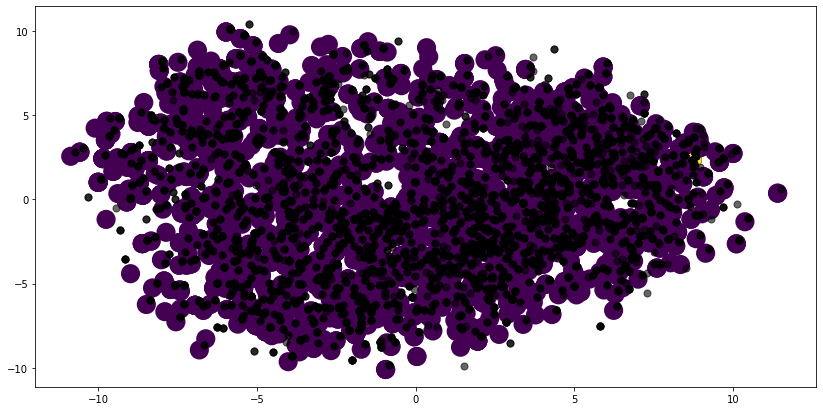

In [49]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels_manhattan , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_manhattan.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [50]:
with open('dbscan_manhattan_180_2_all_mini_l6v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mini_l6v2_manhattan, f)

In [51]:
DBSCAN_cluster_all_mini_l6v2_manhattan_2= DBSCAN(eps=160, min_samples=2, metric="manhattan").fit(principalComponents_all_mini_l6v2) 
labels_manhattan_2 = dbscan_predict_manhattan(DBSCAN_cluster_all_mini_l6v2_manhattan_2, principalComponents_all_mini_l6v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,DBSCAN_cluster_all_mini_l6v2_manhattan_2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2, DBSCAN_cluster_all_mini_l6v2_manhattan_2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  29.574161635457575
silhouette score of model on train data:  0.7710818694095835


In [52]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mini_l6v2_manhattan_2.labels_)))

Number of cluster:  1282


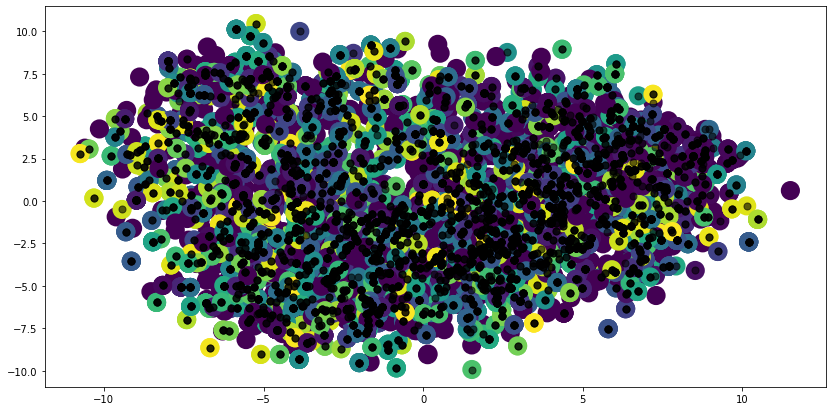

In [53]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=DBSCAN_cluster_all_mini_l6v2_manhattan_2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_manhattan_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [54]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels_manhattan_2 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels_manhattan_2, metric='euclidean'))

calinski harabasz score of model on test data:  1.1618696312356886
silhouette score of model on test data:  0.037041994079999384


In [55]:
print("Number of cluster: ",len(np.unique(labels_manhattan_2)))

Number of cluster:  2


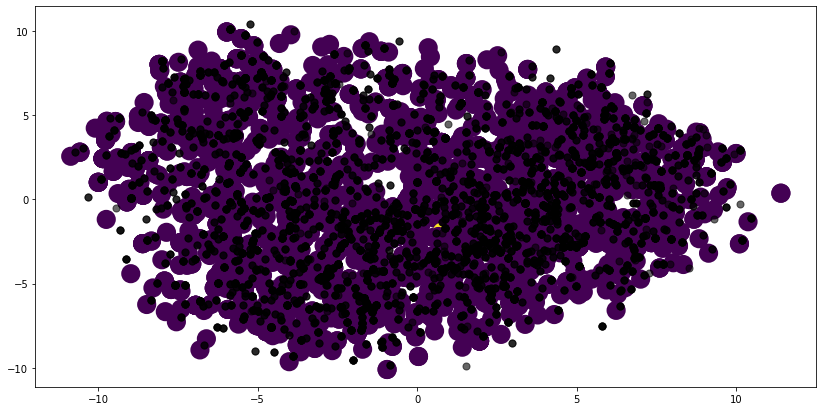

In [56]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels_manhattan_2, s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mini_l6v2_manhattan_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [57]:
with open('dbscan_manhattan_160_2_all_mini_l6v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mini_l6v2_manhattan_2, f)

In [58]:
for i in range(2,10):
  DBSCAN_cluster_all_mini_l6v2_min_samp_manhattan = DBSCAN(eps=180, min_samples=i, metric="manhattan").fit(principalComponents_all_mini_l6v2) 
  print("calinski harabasz score of model with min_samples as {min}: {ch} ".format(min=i, ch= metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,DBSCAN_cluster_all_mini_l6v2_min_samp_manhattan.labels_ )) )
  print("silhouette score of model with min_samples as {min}: {ss}".format(min = i, ss= metrics.silhouette_score(principalComponents_all_mini_l6v2, DBSCAN_cluster_all_mini_l6v2_min_samp_manhattan.labels_ , metric='euclidean')) )


calinski harabasz score of model with min_samples as 2: 15.056002803864542 
silhouette score of model with min_samples as 2: 0.5371209006503883
calinski harabasz score of model with min_samples as 3: 15.741908965442587 
silhouette score of model with min_samples as 3: 0.4307924456766827
calinski harabasz score of model with min_samples as 4: 16.581898725197163 
silhouette score of model with min_samples as 4: 0.34494285664599045
calinski harabasz score of model with min_samples as 5: 17.08142504937615 
silhouette score of model with min_samples as 5: 0.27031763168531986
calinski harabasz score of model with min_samples as 6: 17.800621066779478 
silhouette score of model with min_samples as 6: 0.21220512486466972
calinski harabasz score of model with min_samples as 7: 18.730411577936476 
silhouette score of model with min_samples as 7: 0.15654490014191358
calinski harabasz score of model with min_samples as 8: 19.87235767130914 
silhouette score of model with min_samples as 8: 0.1082294

### Model : all-mpnet-base-v2

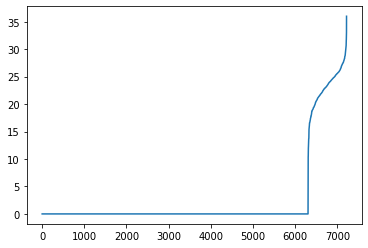

In [59]:
#https://stats.stackexchange.com/questions/406587/determining-epsilon-for-dbscan
#https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

neigh = NearestNeighbors(n_neighbors=2, metric='euclidean')
nbrs = neigh.fit(principalComponents_all_mpnet_basev2)
distances, indices = nbrs.kneighbors(principalComponents_all_mpnet_basev2)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [60]:
DBSCAN_cluster_all_mpnet_basev2 = DBSCAN(eps=17, min_samples=2).fit(principalComponents_all_mpnet_basev2) 
labels = dbscan_predict(DBSCAN_cluster_all_mpnet_basev2, principalComponents_all_mpnet_basev2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mpnet_basev2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mpnet_basev2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  31.910824096429668
silhouette score of model on train data:  0.8218188206052363


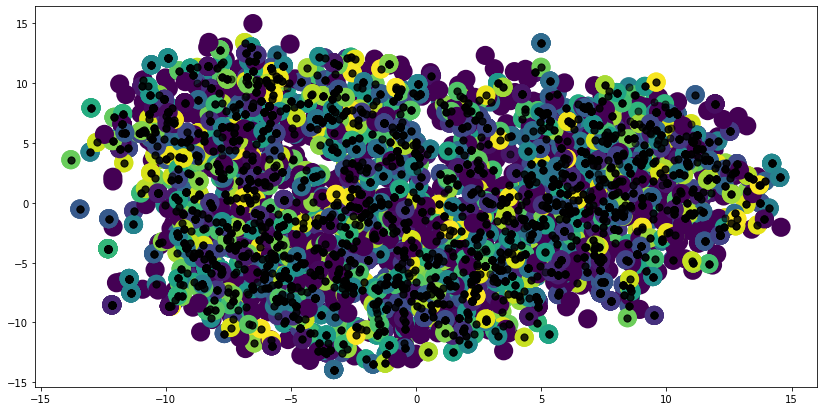

In [61]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=DBSCAN_cluster_all_mpnet_basev2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [62]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mpnet_basev2.labels_)))

Number of cluster:  1365


In [63]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels, metric='euclidean'))

calinski harabasz score of model on test data:  7.593064480755851
silhouette score of model on test data:  0.543334177886935


In [64]:
print("Number of cluster: ",len(np.unique(labels)))

Number of cluster:  930


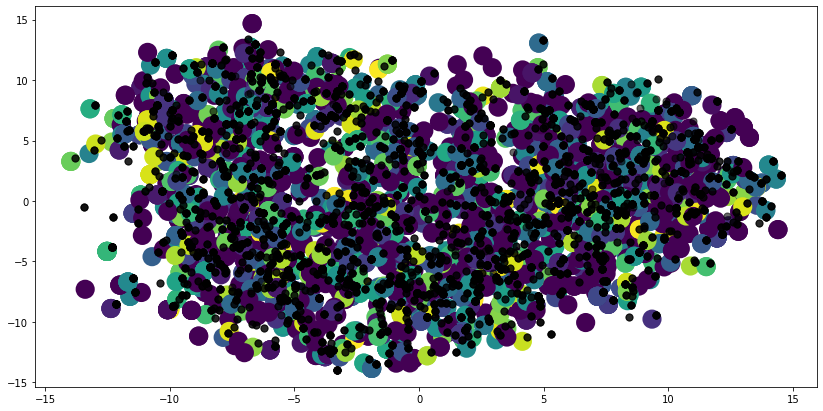

In [65]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [66]:
with open('dbscan_17_2_all_mpnet_basev2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mpnet_basev2, f)

In [67]:
DBSCAN_cluster_all_mpnet_basev2_2 = DBSCAN(eps=20, min_samples=2).fit(principalComponents_all_mpnet_basev2) 
labels_2 = dbscan_predict(DBSCAN_cluster_all_mpnet_basev2_2, principalComponents_all_mpnet_basev2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mpnet_basev2_2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mpnet_basev2_2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  31.42584881059951
silhouette score of model on train data:  0.7691651917530976


In [68]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mpnet_basev2_2.labels_)))

Number of cluster:  1270


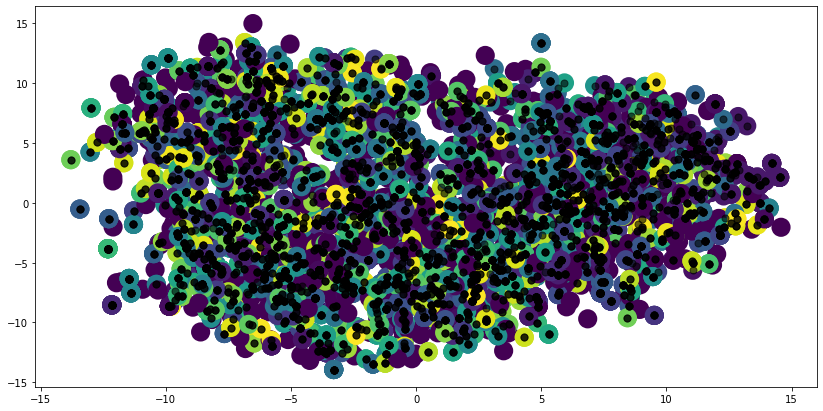

In [69]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=DBSCAN_cluster_all_mpnet_basev2_2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [70]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels_2 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels_2, metric='euclidean'))

calinski harabasz score of model on test data:  8.194095852002867
silhouette score of model on test data:  0.5154420801950145


In [71]:
print("Number of cluster: ",len(np.unique(labels_2)))

Number of cluster:  876


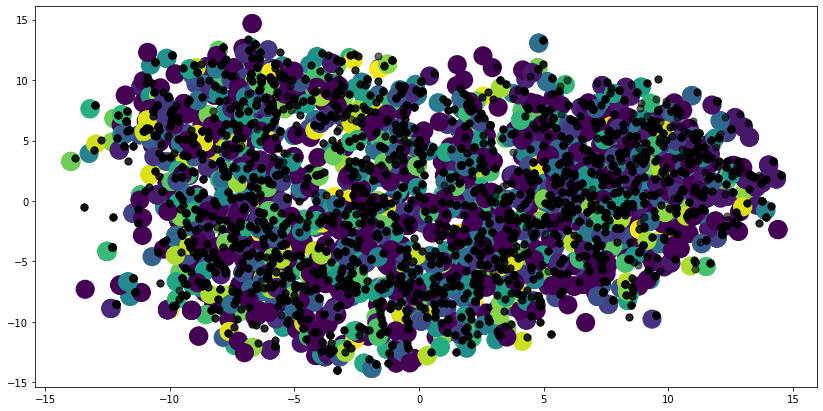

In [72]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels_2 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [73]:
with open('dbscan_20_2_all_mpnet_basev2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mpnet_basev2_2, f)

In [74]:
DBSCAN_cluster_all_mpnet_basev2_3 = DBSCAN(eps=15, min_samples=2).fit(principalComponents_all_mpnet_basev2) 
labels_3 = dbscan_predict(DBSCAN_cluster_all_mpnet_basev2_3, principalComponents_all_mpnet_basev2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mpnet_basev2_3.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mpnet_basev2_3.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  31.217379384665488
silhouette score of model on train data:  0.8245074437142258


In [75]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mpnet_basev2_3.labels_)))

Number of cluster:  1371


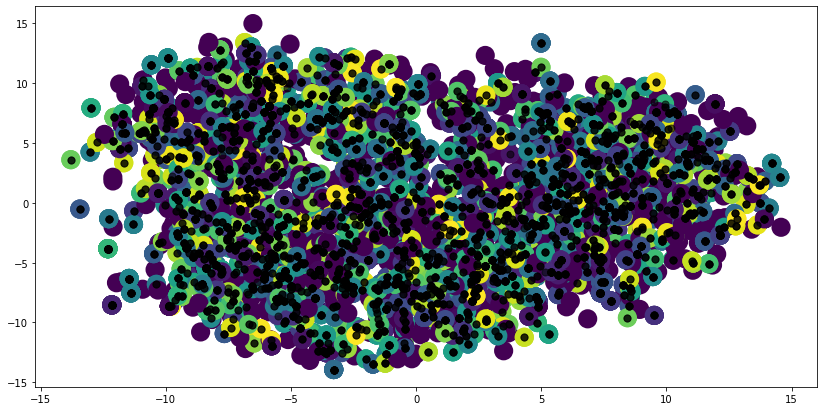

In [76]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=DBSCAN_cluster_all_mpnet_basev2_3.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [77]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels_3 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels_3, metric='euclidean'))

calinski harabasz score of model on test data:  7.356536109876014
silhouette score of model on test data:  0.5400081326178316


In [78]:
print("Number of cluster: ",len(np.unique(labels_3)))

Number of cluster:  927


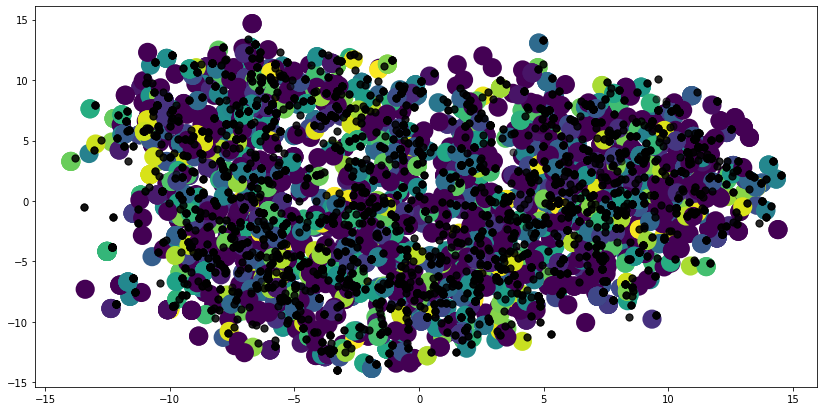

In [79]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels_3 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [80]:
with open('dbscan_15_2_all_mpnet_basev2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mpnet_basev2_3, f)

In [81]:
DBSCAN_cluster_all_mpnet_basev2_4 = DBSCAN(eps=25, min_samples=2).fit(principalComponents_all_mpnet_basev2) 
labels_4 = dbscan_predict(DBSCAN_cluster_all_mpnet_basev2_4, principalComponents_all_mpnet_basev2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mpnet_basev2_4.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mpnet_basev2_4.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  10.446872594756274
silhouette score of model on train data:  0.2703291762676918


In [82]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mpnet_basev2_4.labels_)))

Number of cluster:  612


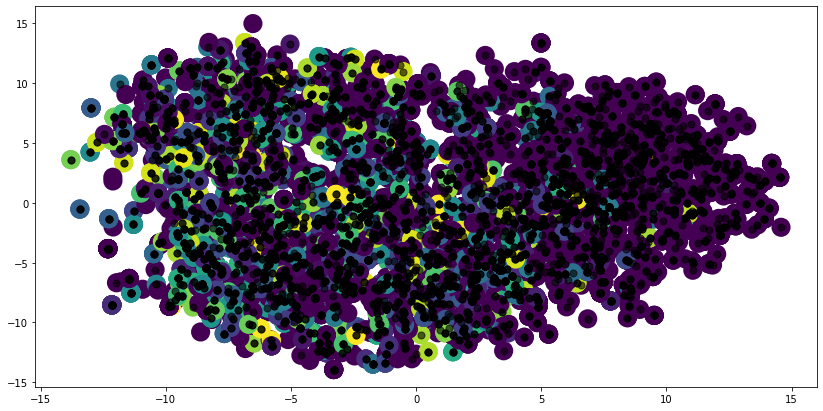

In [83]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=DBSCAN_cluster_all_mpnet_basev2_4.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_4.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [84]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels_4 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels_4, metric='euclidean'))

calinski harabasz score of model on test data:  5.059177262197392
silhouette score of model on test data:  0.18522840648460961


In [85]:
print("Number of cluster: ",len(np.unique(labels_4)))

Number of cluster:  435


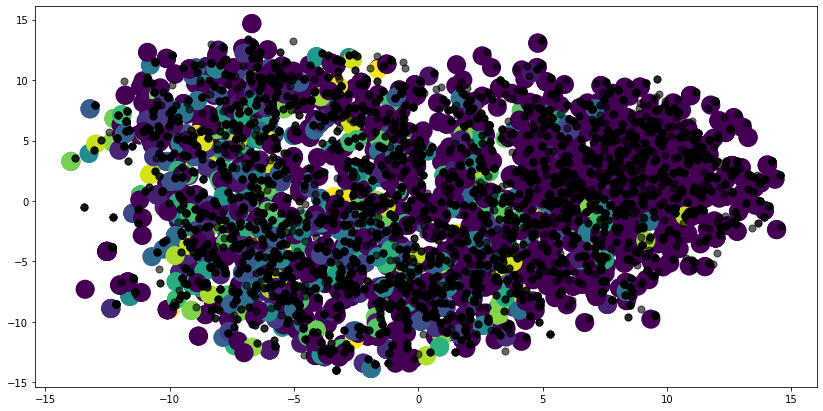

In [86]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels_4 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_4.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [87]:
with open('dbscan_25_2_all_mpnet_basev2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mpnet_basev2_4, f)

In [88]:
for i in range(2,10):
  DBSCAN_cluster_all_mpnet_basev2_min_samp = DBSCAN(eps=15, min_samples=i).fit(principalComponents_all_mpnet_basev2) 
  print("calinski harabasz score of model with min_samples as {min}: {ch} ".format(min=i, ch= metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mpnet_basev2_min_samp.labels_ )) )
  print("silhouette score of model with min_samples as {min}: {ss}".format(min = i, ss= metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mpnet_basev2_min_samp.labels_ , metric='euclidean')) )


calinski harabasz score of model with min_samples as 2: 31.217379384665488 
silhouette score of model with min_samples as 2: 0.8245074437142258
calinski harabasz score of model with min_samples as 3: 21.148305931865902 
silhouette score of model with min_samples as 3: 0.6506101866148454
calinski harabasz score of model with min_samples as 4: 18.75901124842039 
silhouette score of model with min_samples as 4: 0.5114176333143802
calinski harabasz score of model with min_samples as 5: 17.67716606422518 
silhouette score of model with min_samples as 5: 0.3932861078492967
calinski harabasz score of model with min_samples as 6: 17.55603255961674 
silhouette score of model with min_samples as 6: 0.30096555309431366
calinski harabasz score of model with min_samples as 7: 17.692729380241694 
silhouette score of model with min_samples as 7: 0.2161472465460996
calinski harabasz score of model with min_samples as 8: 18.14718609884649 
silhouette score of model with min_samples as 8: 0.146163961949

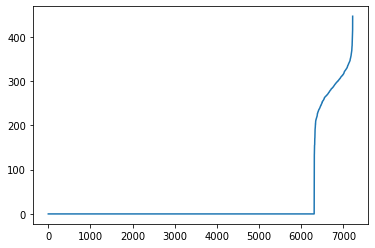

In [89]:
#https://stats.stackexchange.com/questions/406587/determining-epsilon-for-dbscan
#https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

neigh = NearestNeighbors(n_neighbors=2, metric='manhattan')
nbrs = neigh.fit(principalComponents_all_mpnet_basev2)
distances, indices = nbrs.kneighbors(principalComponents_all_mpnet_basev2)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [90]:
DBSCAN_cluster_all_mpnet_basev2_manhattan= DBSCAN(eps=250, min_samples=2, metric="manhattan").fit(principalComponents_all_mpnet_basev2) 
labels_manhattan = dbscan_predict_manhattan(DBSCAN_cluster_all_mpnet_basev2_manhattan, principalComponents_all_mpnet_basev2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mpnet_basev2_manhattan.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mpnet_basev2_manhattan.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  30.638840201181903
silhouette score of model on train data:  0.7584161748576776


In [91]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mpnet_basev2_manhattan.labels_)))

Number of cluster:  1251


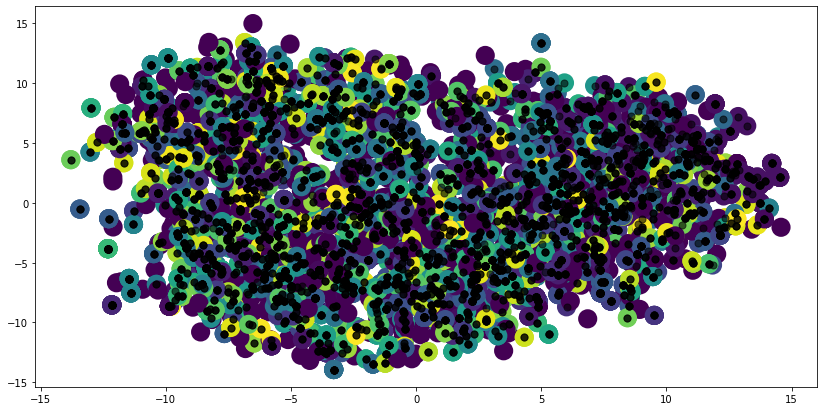

In [92]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=DBSCAN_cluster_all_mpnet_basev2_manhattan.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_manhattan.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [93]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels_manhattan ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels_manhattan, metric='euclidean'))

calinski harabasz score of model on test data:  1.3168552257480652
silhouette score of model on test data:  0.0024829775462783554


In [94]:
print("Number of cluster: ",len(np.unique(labels_manhattan)))

Number of cluster:  2


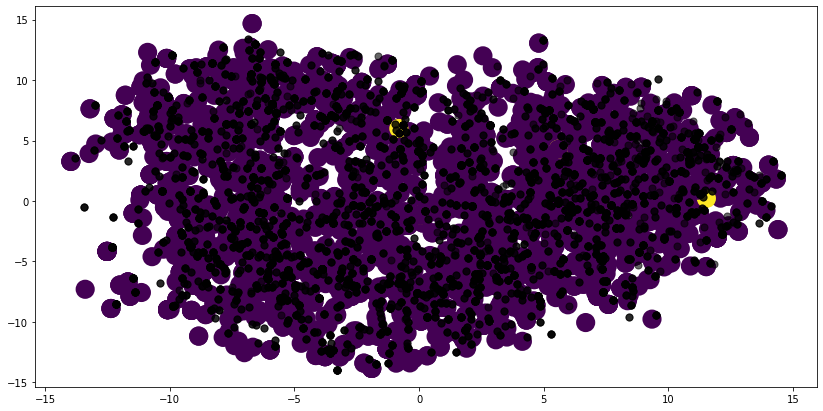

In [95]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels_manhattan , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_manhattan.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [96]:
with open('dbscan_manhattan_250_2_all_mpnet_basev2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mpnet_basev2_manhattan, f)

In [97]:
DBSCAN_cluster_all_mpnet_basev2_manhattan_3= DBSCAN(eps=280, min_samples=2, metric="manhattan").fit(principalComponents_all_mpnet_basev2) 
labels_manhattan_3 = dbscan_predict_manhattan(DBSCAN_cluster_all_mpnet_basev2_manhattan_3, principalComponents_all_mpnet_basev2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,DBSCAN_cluster_all_mpnet_basev2_manhattan_3.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, DBSCAN_cluster_all_mpnet_basev2_manhattan_3.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  16.233154289272026
silhouette score of model on train data:  0.5365352816070896


In [98]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_mpnet_basev2_manhattan_3.labels_)))

Number of cluster:  975


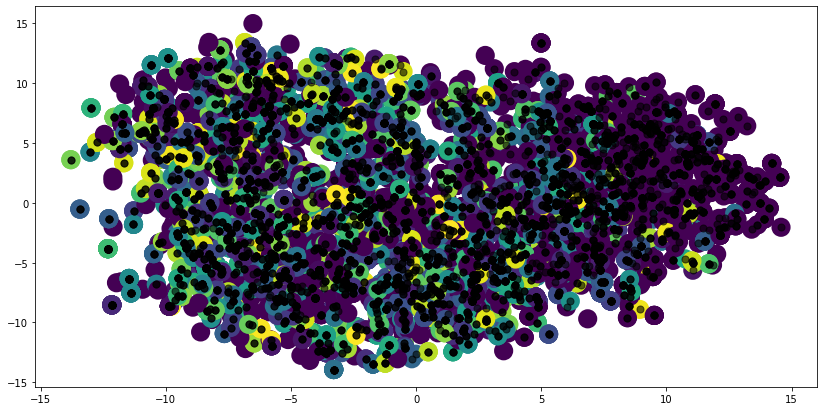

In [99]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=DBSCAN_cluster_all_mpnet_basev2_manhattan_3.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_manhattan_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [100]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels_manhattan_3 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels_manhattan_3, metric='euclidean'))

calinski harabasz score of model on test data:  1.0500563566855263
silhouette score of model on test data:  -0.006864724041718209


In [101]:
print("Number of cluster: ",len(np.unique(labels_manhattan_3)))

Number of cluster:  2


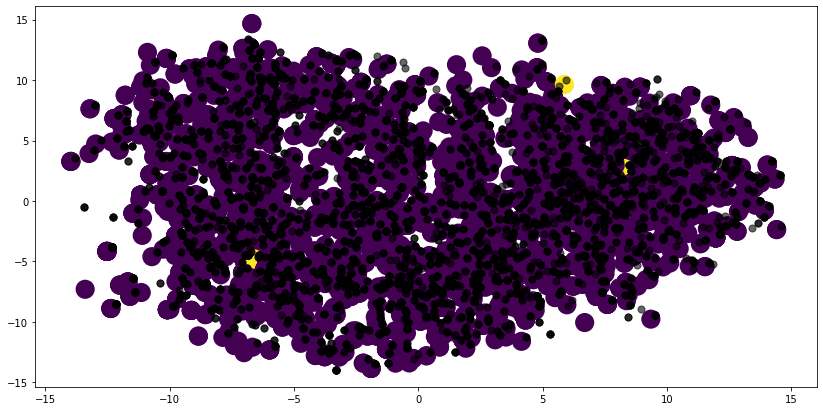

In [102]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels_manhattan_3 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_mpnet_basev2_manhattan_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [103]:
with open('dbscan_manhattan_280_2_all_mpnet_basev2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_mpnet_basev2_manhattan_3, f)

### Model : paraphrase-MiniLM-L3-v2

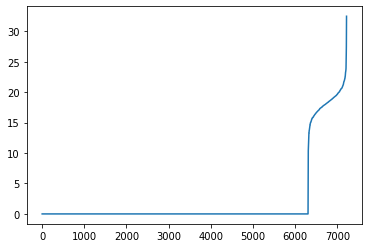

In [104]:
#https://stats.stackexchange.com/questions/406587/determining-epsilon-for-dbscan
#https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

neigh = NearestNeighbors(n_neighbors=2, metric='euclidean')
nbrs = neigh.fit(principalComponents_all_minilm_l3v2)
distances, indices = nbrs.kneighbors(principalComponents_all_minilm_l3v2)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [105]:
DBSCAN_cluster_all_minilm_l3v2 = DBSCAN(eps=17, min_samples=2).fit(principalComponents_all_minilm_l3v2) 
labels = dbscan_predict(DBSCAN_cluster_all_minilm_l3v2, principalComponents_all_minilm_l3v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,DBSCAN_cluster_all_minilm_l3v2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, DBSCAN_cluster_all_minilm_l3v2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  20.251801046175952
silhouette score of model on train data:  0.6681610090085629


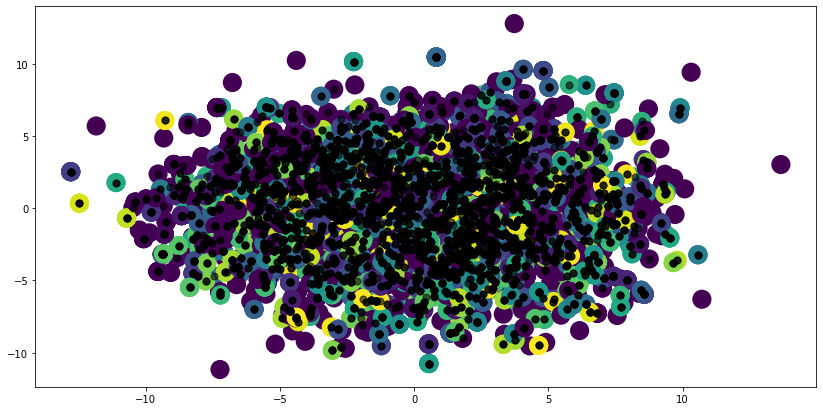

In [106]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=DBSCAN_cluster_all_minilm_l3v2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [107]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_minilm_l3v2.labels_)))

Number of cluster:  1137


In [108]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels, metric='euclidean'))

calinski harabasz score of model on test data:  6.784322122282853
silhouette score of model on test data:  0.46023849609069095


In [109]:
print("Number of cluster: ",len(np.unique(labels)))

Number of cluster:  784


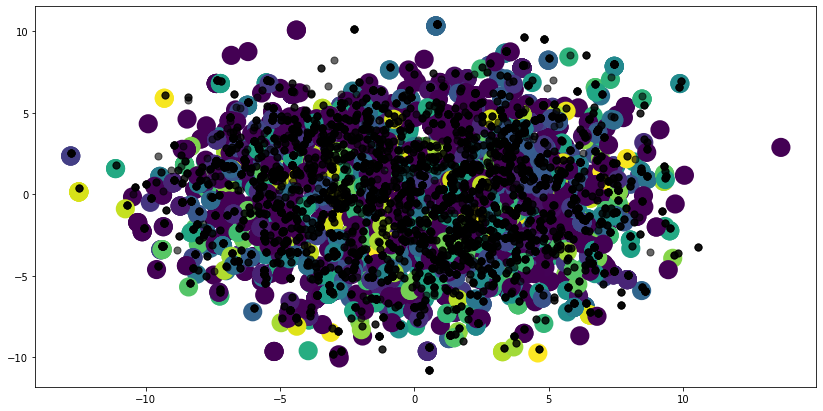

In [110]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [111]:
with open('dbscan_17_2_all_minilm_l3v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_minilm_l3v2, f)

In [112]:
DBSCAN_cluster_all_minilm_l3v2_2 = DBSCAN(eps=20, min_samples=2).fit(principalComponents_all_minilm_l3v2) 
labels_2 = dbscan_predict(DBSCAN_cluster_all_minilm_l3v2_2, principalComponents_all_minilm_l3v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,DBSCAN_cluster_all_minilm_l3v2_2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, DBSCAN_cluster_all_minilm_l3v2_2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  8.576205888915391
silhouette score of model on train data:  0.09613521011180871


In [113]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_minilm_l3v2_2.labels_)))

Number of cluster:  302


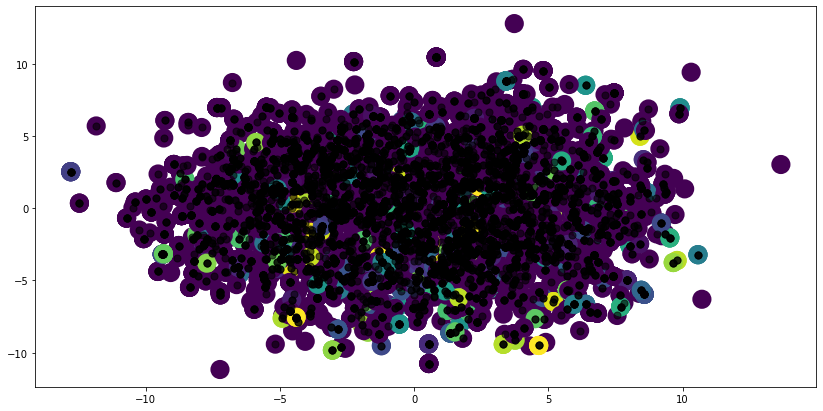

In [114]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=DBSCAN_cluster_all_minilm_l3v2_2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [115]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels_2 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels_2, metric='euclidean'))

calinski harabasz score of model on test data:  4.2782623153623005
silhouette score of model on test data:  0.04635209419694224


In [116]:
print("Number of cluster: ",len(np.unique(labels_2)))

Number of cluster:  216


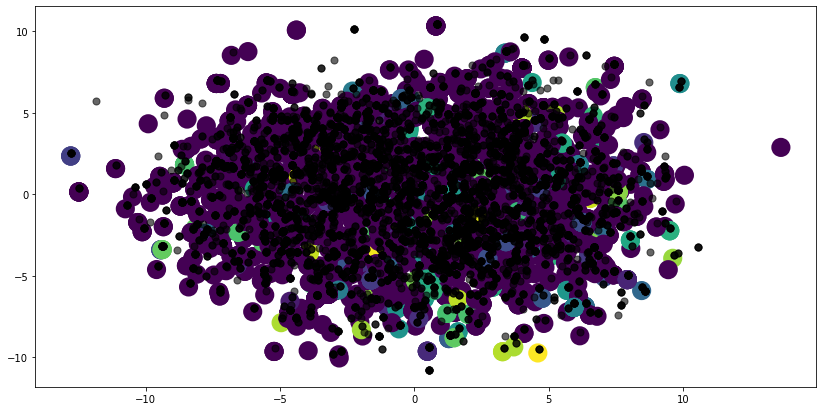

In [117]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels_2 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [118]:
with open('dbscan_20_2_all_minilm_l3v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_minilm_l3v2_2, f)

In [119]:
DBSCAN_cluster_all_minilm_l3v2_3 = DBSCAN(eps=15, min_samples=2).fit(principalComponents_all_minilm_l3v2) 
labels_3 = dbscan_predict(DBSCAN_cluster_all_minilm_l3v2_3, principalComponents_all_minilm_l3v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,DBSCAN_cluster_all_minilm_l3v2_3.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, DBSCAN_cluster_all_minilm_l3v2_3.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  30.242427918037606
silhouette score of model on train data:  0.8208678778221358


In [120]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_minilm_l3v2_3.labels_)))

Number of cluster:  1357


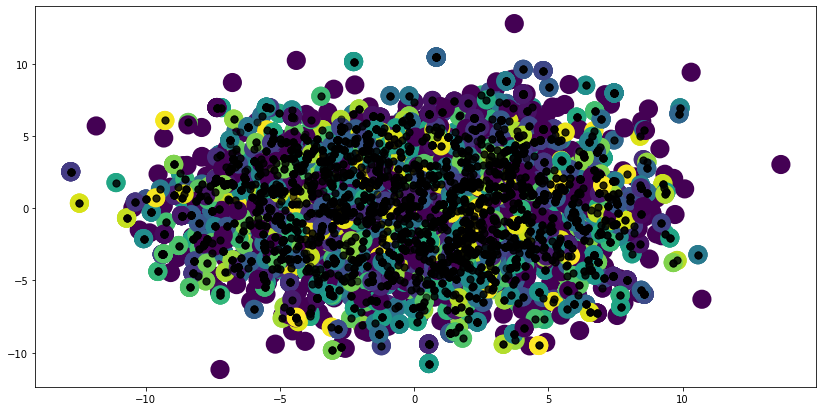

In [121]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=DBSCAN_cluster_all_minilm_l3v2_3.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [122]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels_3 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels_3, metric='euclidean'))

calinski harabasz score of model on test data:  7.4634970527187345
silhouette score of model on test data:  0.5570642075252783


In [123]:
print("Number of cluster: ",len(np.unique(labels_3)))

Number of cluster:  920


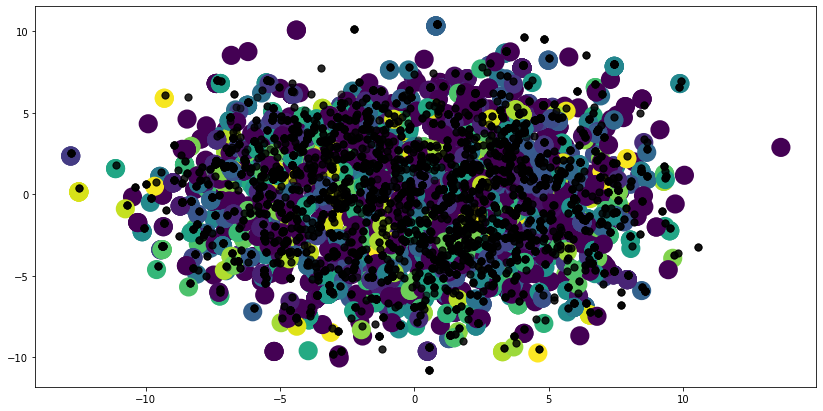

In [124]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels_3 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_3.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [125]:
with open('dbscan_15_2_all_minilm_l3v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_minilm_l3v2_3, f)

In [126]:
DBSCAN_cluster_all_minilm_l3v2_4 = DBSCAN(eps=25, min_samples=2).fit(principalComponents_all_minilm_l3v2) 
labels_4 = dbscan_predict(DBSCAN_cluster_all_minilm_l3v2_4, principalComponents_all_minilm_l3v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,DBSCAN_cluster_all_mini_l6v2_4.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, DBSCAN_cluster_all_mini_l6v2_4.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  19.88509684080721
silhouette score of model on train data:  0.043006903990803834


In [127]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_minilm_l3v2_4.labels_)))

Number of cluster:  17


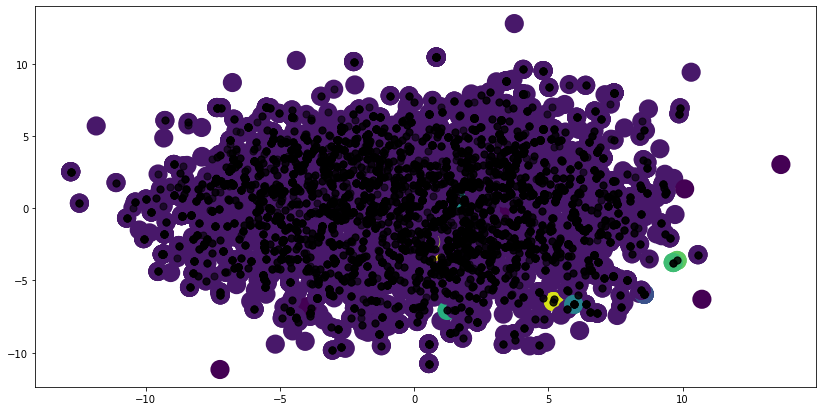

In [128]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=DBSCAN_cluster_all_minilm_l3v2_4.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [129]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels_4 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels_4, metric='euclidean'))

calinski harabasz score of model on test data:  6.367880512267388
silhouette score of model on test data:  0.13516591996170346


In [130]:
print("Number of cluster: ",len(np.unique(labels_4)))

Number of cluster:  11


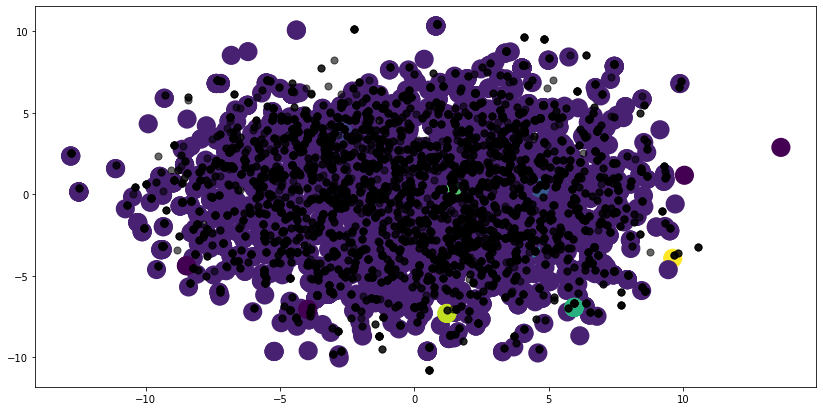

In [131]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels_4 , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [132]:
with open('dbscan_25_2_all_minilm_l3v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_minilm_l3v2_4, f)

In [133]:
for i in range(2,10):
  DBSCAN_cluster_all_minilm_l3v2_min_samp = DBSCAN(eps=15, min_samples=i).fit(principalComponents_all_minilm_l3v2) 
  print("calinski harabasz score of model with min_samples as {min}: {ch} ".format(min=i, ch= metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,DBSCAN_cluster_all_minilm_l3v2_min_samp.labels_ )) )
  print("silhouette score of model with min_samples as {min}: {ss}".format(min = i, ss= metrics.silhouette_score(principalComponents_all_minilm_l3v2, DBSCAN_cluster_all_minilm_l3v2_min_samp.labels_ , metric='euclidean')) )


calinski harabasz score of model with min_samples as 2: 30.242427918037606 
silhouette score of model with min_samples as 2: 0.8208678778221358
calinski harabasz score of model with min_samples as 3: 20.7956528696677 
silhouette score of model with min_samples as 3: 0.6591448430618836
calinski harabasz score of model with min_samples as 4: 18.670076092232343 
silhouette score of model with min_samples as 4: 0.5273693561808842
calinski harabasz score of model with min_samples as 5: 17.82830214524871 
silhouette score of model with min_samples as 5: 0.4120139818770989
calinski harabasz score of model with min_samples as 6: 18.025170189958214 
silhouette score of model with min_samples as 6: 0.32307420254047786
calinski harabasz score of model with min_samples as 7: 18.144762406594378 
silhouette score of model with min_samples as 7: 0.2417587685831355
calinski harabasz score of model with min_samples as 8: 18.655423127661205 
silhouette score of model with min_samples as 8: 0.17072834574

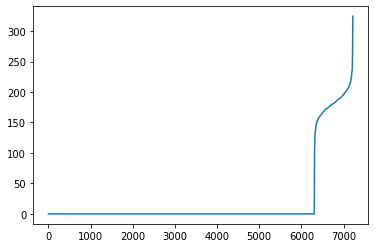

In [134]:
#https://stats.stackexchange.com/questions/406587/determining-epsilon-for-dbscan
#https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

neigh = NearestNeighbors(n_neighbors=2, metric='manhattan')
nbrs = neigh.fit(principalComponents_all_minilm_l3v2)
distances, indices = nbrs.kneighbors(principalComponents_all_minilm_l3v2)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [135]:
DBSCAN_cluster_all_minilm_l3v2_manhattan= DBSCAN(eps=180, min_samples=2, metric="manhattan").fit(principalComponents_all_minilm_l3v2) 
labels_manhattan = dbscan_predict_manhattan(DBSCAN_cluster_all_minilm_l3v2_manhattan, principalComponents_all_minilm_l3v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,DBSCAN_cluster_all_minilm_l3v2_manhattan.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, DBSCAN_cluster_all_minilm_l3v2_manhattan.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  10.710184830055784
silhouette score of model on train data:  0.3831837779130417


In [136]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_minilm_l3v2_manhattan.labels_)))

Number of cluster:  785


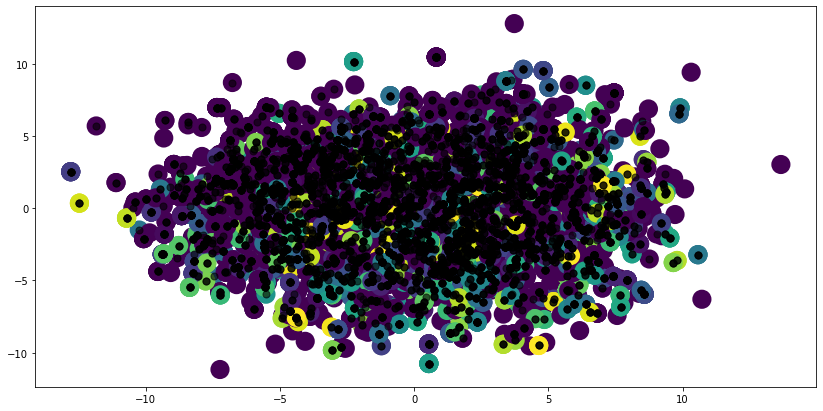

In [137]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=DBSCAN_cluster_all_minilm_l3v2_manhattan.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_manhattan.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [138]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels_manhattan ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels_manhattan, metric='euclidean'))

calinski harabasz score of model on test data:  0.9140388681395477
silhouette score of model on test data:  -0.0292139757060804


In [139]:
print("Number of cluster: ",len(np.unique(labels_manhattan)))

Number of cluster:  2


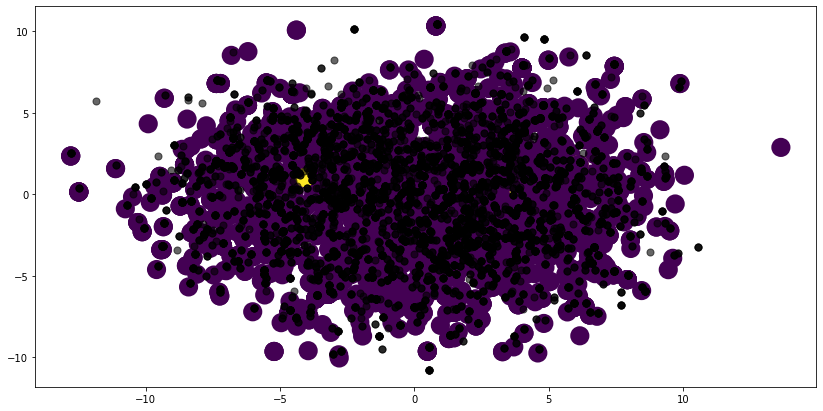

In [140]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels_manhattan , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_manhattan.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [141]:
with open('dbscan_manhattan_180_2_all_minilm_l3v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_minilm_l3v2_manhattan, f)

In [142]:
DBSCAN_cluster_all_minilm_l3v2_manhattan_2= DBSCAN(eps=150, min_samples=2, metric="manhattan").fit(principalComponents_all_minilm_l3v2) 
labels_manhattan_2 = dbscan_predict_manhattan(DBSCAN_cluster_all_minilm_l3v2_manhattan_2, principalComponents_all_minilm_l3v2_test)

print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,DBSCAN_cluster_all_minilm_l3v2_manhattan_2.labels_ ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, DBSCAN_cluster_all_minilm_l3v2_manhattan_2.labels_ , metric='euclidean'))


calinski harabasz score of model on train data:  30.183979577750158
silhouette score of model on train data:  0.8217005432475432


In [143]:
print("Number of cluster: ",len(np.unique(DBSCAN_cluster_all_minilm_l3v2_manhattan_2.labels_)))

Number of cluster:  1358


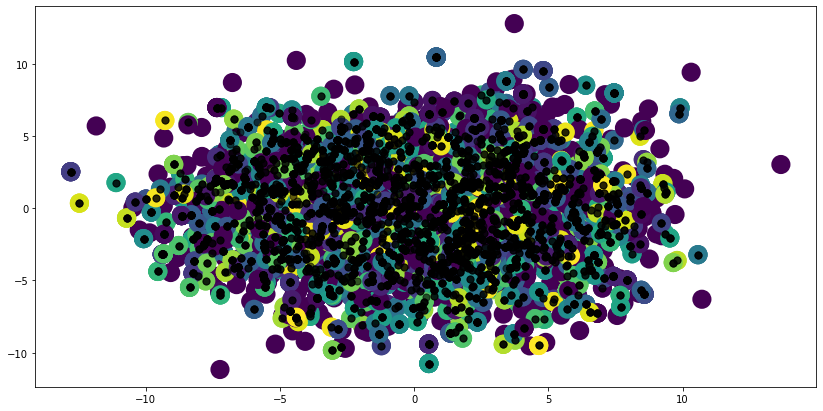

In [144]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=DBSCAN_cluster_all_minilm_l3v2_manhattan_2.labels_ , s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_manhattan_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [145]:
print("calinski harabasz score of model on test data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels_manhattan_2 ))
print("silhouette score of model on test data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels_manhattan_2, metric='euclidean'))

calinski harabasz score of model on test data:  0.9350324568950268
silhouette score of model on test data:  -0.015801361822582155


In [146]:
print("Number of cluster: ",len(np.unique(labels_manhattan_2)))

Number of cluster:  2


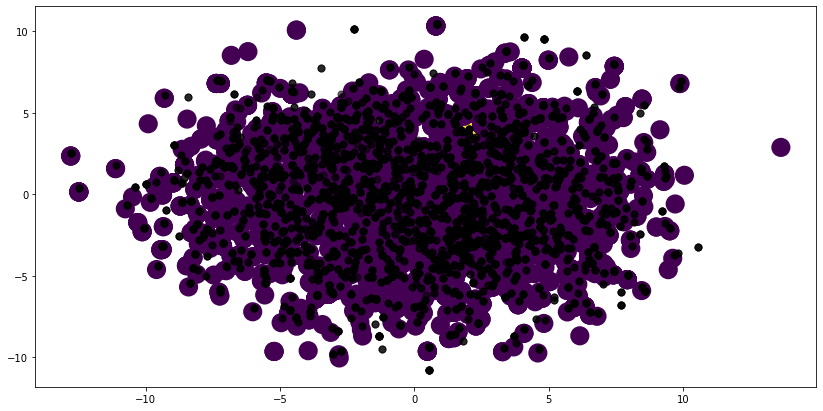

In [147]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels_manhattan_2, s=200, cmap='viridis', linewidths=5)

centers = DBSCAN_cluster_all_minilm_l3v2_manhattan_2.components_
plt.scatter(centers[:, 0], centers[:, 1],c='black', s=50, alpha=0.6);

In [148]:
with open('dbscan_manhattan_150_2_all_minilm_l3v2.pickle', 'wb') as f:
    pickle.dump(DBSCAN_cluster_all_minilm_l3v2_manhattan_2, f)

## Gaussian Mixture

### Model : all-MiniLM-L6-v2

In [149]:
int(principalComponents_all_mini_l6v2.shape[0]/5)

1444

In [ ]:
#run this on local bc of limitations of colab
n_components = np.arange(800, 1400, 30)
models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(principalComponents_all_mini_l6v2)
          for n in n_components]

plt.plot(n_components, [m.bic(principalComponents_all_mini_l6v2) for m in models], label='BIC')
plt.plot(n_components, [m.aic(principalComponents_all_mini_l6v2) for m in models], label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components');

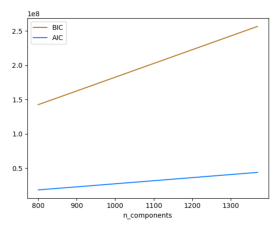

In [ ]:
import cv2
img_color = cv2.imread('gm.png',1)
plt.imshow(img_color)
plt.axis("off")
plt.show()

In [151]:
gmm_all_mini_l6v2 = GaussianMixture(n_components=800, covariance_type='full', random_state=0).fit(principalComponents_all_mini_l6v2)
fitted = gmm_all_mini_l6v2.predict(principalComponents_all_mini_l6v2)
labels = gmm_all_mini_l6v2.predict(principalComponents_all_mini_l6v2_test)
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2, fitted ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2, fitted , metric='euclidean'))


calinski harabasz score of model on train data:  32.44436143866697
silhouette score of model on train data:  0.5688732474220397


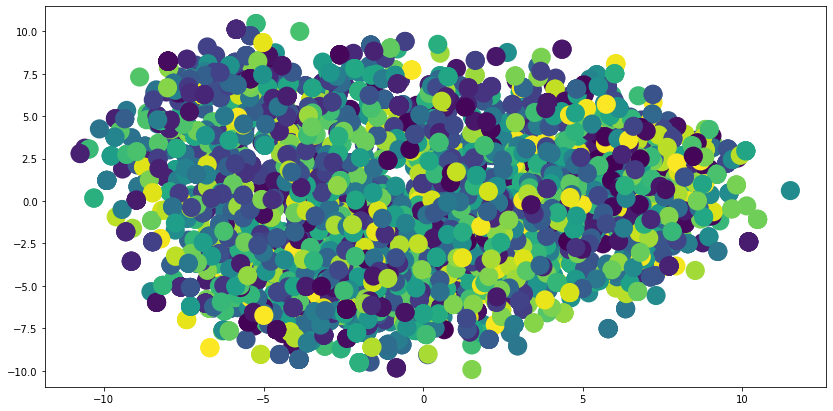

In [152]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=fitted , s=200, cmap='viridis', linewidths=5)


In [153]:
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels , metric='euclidean'))


calinski harabasz score of model on train data:  12.644419221090038
silhouette score of model on train data:  0.4841515980105566


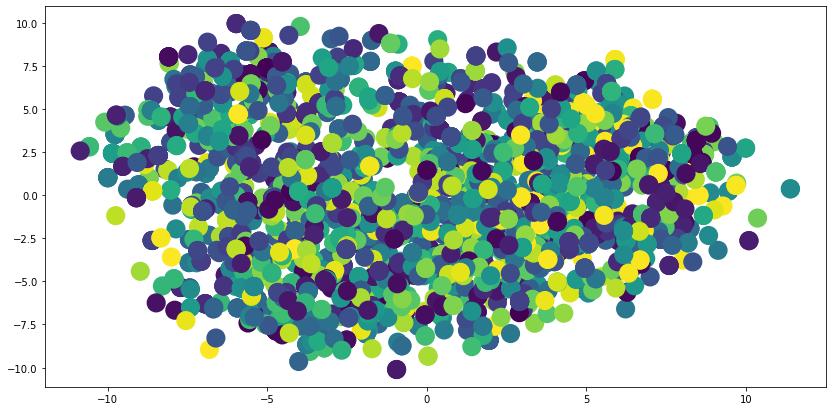

In [154]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels , s=200, cmap='viridis', linewidths=5)


In [155]:
with open('gm_800_all_mini_l6v2.pickle', 'wb') as f:
    pickle.dump(gmm_all_mini_l6v2, f)

In [156]:
gmm_all_mini_l6v2_2 = GaussianMixture(n_components=800, covariance_type='full', random_state=0, init_params='random').fit(principalComponents_all_mini_l6v2)
fitted_2 = gmm_all_mini_l6v2_2.predict(principalComponents_all_mini_l6v2)
labels_2 = gmm_all_mini_l6v2_2.predict(principalComponents_all_mini_l6v2_test)
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,fitted_2 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2, fitted_2  , metric='euclidean'))


calinski harabasz score of model on train data:  3.998557629907582
silhouette score of model on train data:  -0.008587862982005926


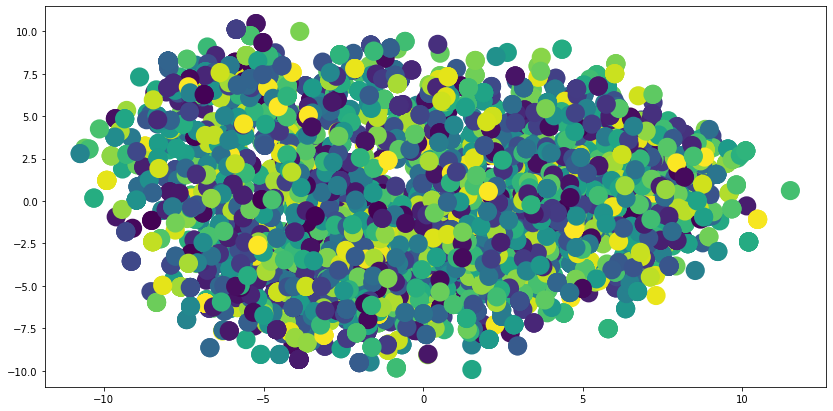

In [157]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=fitted_2  , s=200, cmap='viridis', linewidths=5)


In [158]:
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels_2 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels_2 , metric='euclidean'))


calinski harabasz score of model on train data:  3.2083466093621604
silhouette score of model on train data:  0.058481208831057035


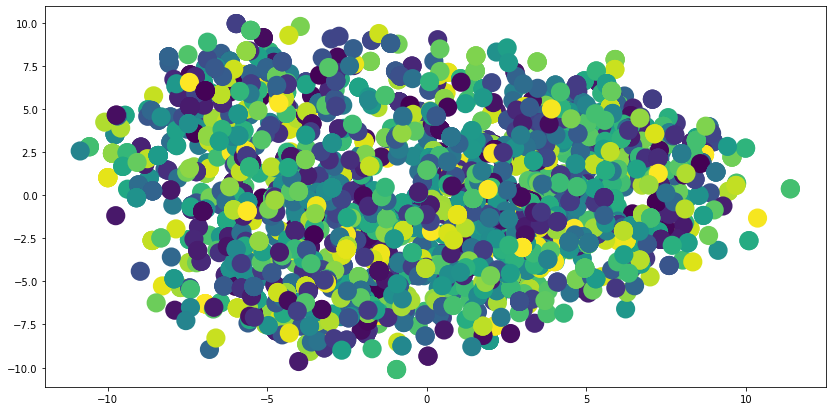

In [159]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels_2 , s=200, cmap='viridis', linewidths=5)


In [160]:
with open('gm_800_all_mini_l6v2_random_init.pickle', 'wb') as f:
    pickle.dump(gmm_all_mini_l6v2_2, f)

In [161]:
gmm_all_mini_l6v2_3 = GaussianMixture(n_components=1001, covariance_type='full', random_state=0).fit(principalComponents_all_mini_l6v2)
fitted_3 = gmm_all_mini_l6v2_3.predict(principalComponents_all_mini_l6v2)
labels_3 = gmm_all_mini_l6v2_3.predict(principalComponents_all_mini_l6v2_test)
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,fitted_3 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2, fitted_3, metric='euclidean'))


calinski harabasz score of model on train data:  35.738707815107084
silhouette score of model on train data:  0.6489054094126072


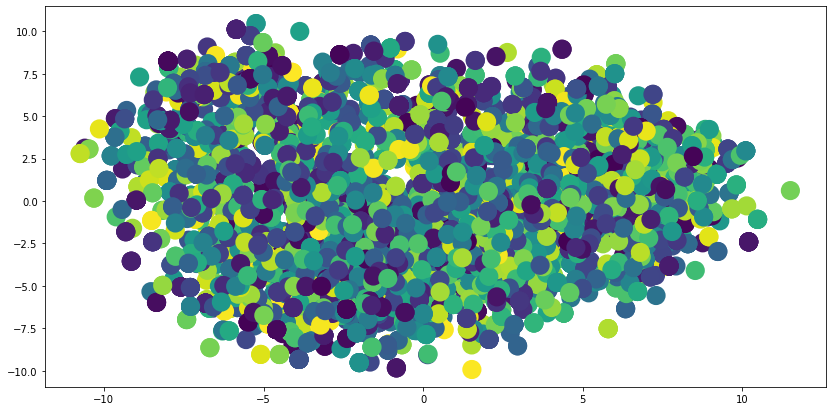

In [162]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=fitted_3 , s=200, cmap='viridis', linewidths=5)


In [163]:
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels_3 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels_3 , metric='euclidean'))


calinski harabasz score of model on train data:  13.518188976371812
silhouette score of model on train data:  0.5321160627183323


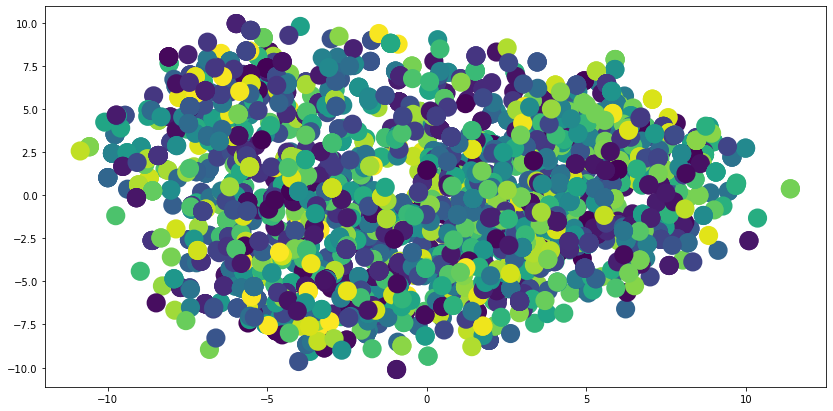

In [164]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels_3 , s=200, cmap='viridis', linewidths=5)


In [165]:
with open('gm_1001_all_mini_l6v2_.pickle', 'wb') as f:
    pickle.dump(gmm_all_mini_l6v2_3, f)

In [166]:
#k-means elbow gives 1001 for clusters
gmm_all_mini_l6v2_4 = GaussianMixture(n_components=1001, covariance_type='full', random_state=0, init_params="random").fit(principalComponents_all_mini_l6v2)
fitted_4 = gmm_all_mini_l6v2_4.predict(principalComponents_all_mini_l6v2)
labels_4 = gmm_all_mini_l6v2_4.predict(principalComponents_all_mini_l6v2_test)
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2,fitted_4 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2, fitted_4 , metric='euclidean'))


calinski harabasz score of model on train data:  4.142486883574513
silhouette score of model on train data:  0.04193773715134372


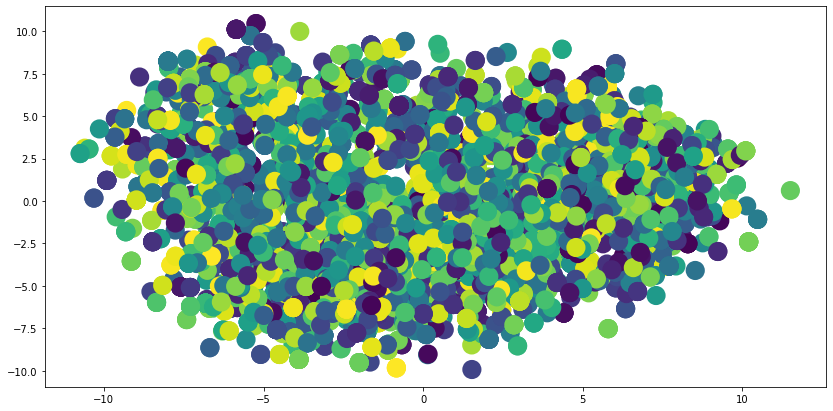

In [167]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2.iloc[:, 0], principalComponents_all_mini_l6v2.iloc[:, 1], c=fitted_4 , s=200, cmap='viridis', linewidths=5)


In [168]:
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mini_l6v2_test,labels_4 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mini_l6v2_test, labels_4 , metric='euclidean'))


calinski harabasz score of model on train data:  3.2709903077135722
silhouette score of model on train data:  0.09041991843760039


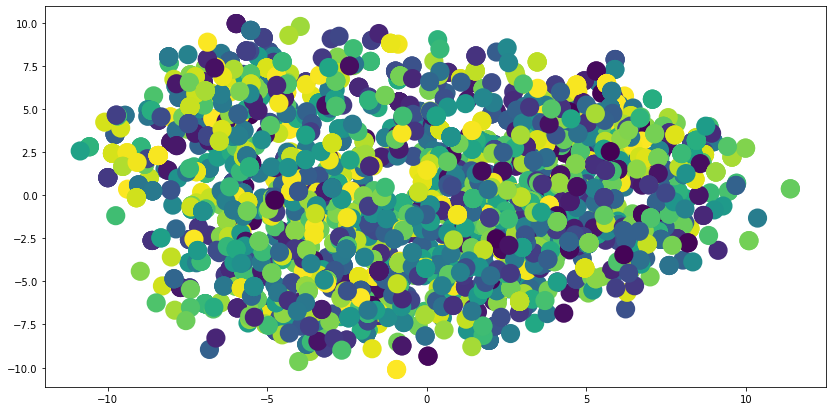

In [169]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mini_l6v2_test.iloc[:, 0], principalComponents_all_mini_l6v2_test.iloc[:, 1], c=labels_4 , s=200, cmap='viridis', linewidths=5)


In [170]:
with open('gm_1001_all_mini_l6v2_random_init.pickle', 'wb') as f:
    pickle.dump(gmm_all_mini_l6v2_4, f)

### Model : all-mpnet-base-v2

In [171]:
gmm_all_mpnet_basev2 = GaussianMixture(n_components=800, covariance_type='full', random_state=0).fit(principalComponents_all_mpnet_basev2)
fitted = gmm_all_mpnet_basev2.predict(principalComponents_all_mpnet_basev2)
labels = gmm_all_mpnet_basev2.predict(principalComponents_all_mpnet_basev2_test)
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2, fitted ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, fitted , metric='euclidean'))


calinski harabasz score of model on train data:  36.08604465286427
silhouette score of model on train data:  0.5737944883157886


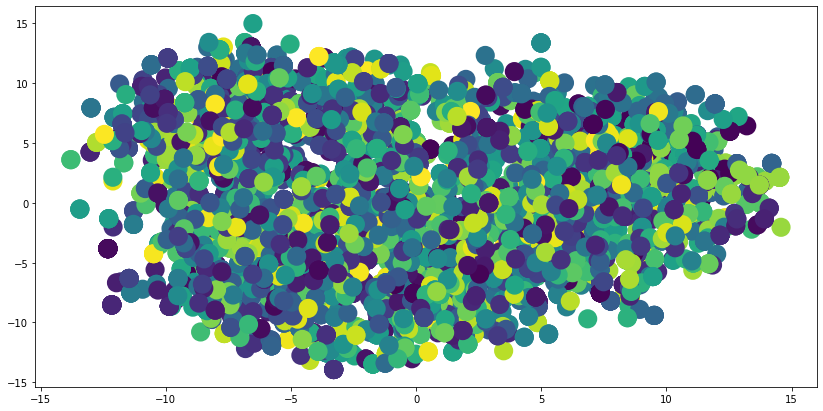

In [172]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=fitted , s=200, cmap='viridis', linewidths=5)


In [173]:
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels , metric='euclidean'))


calinski harabasz score of model on train data:  14.04110776545485
silhouette score of model on train data:  0.4788050673131505


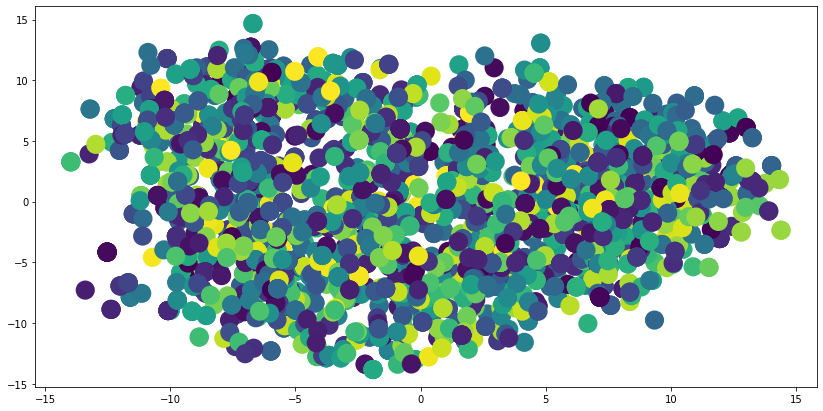

In [174]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels , s=200, cmap='viridis', linewidths=5)


In [175]:
with open('gm_800_all_mpnet_basev2.pickle', 'wb') as f:
    pickle.dump(gmm_all_mpnet_basev2, f)

In [176]:
gmm_all_mpnet_basev2_2 = GaussianMixture(n_components=800, covariance_type='full', random_state=0, init_params='random').fit(principalComponents_all_mpnet_basev2)
fitted_2 = gmm_all_mpnet_basev2_2.predict(principalComponents_all_mpnet_basev2)
labels_2 = gmm_all_mpnet_basev2_2.predict(principalComponents_all_mpnet_basev2_test)
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,fitted_2 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, fitted_2  , metric='euclidean'))


calinski harabasz score of model on train data:  4.102212834533856
silhouette score of model on train data:  -0.05277051089214596


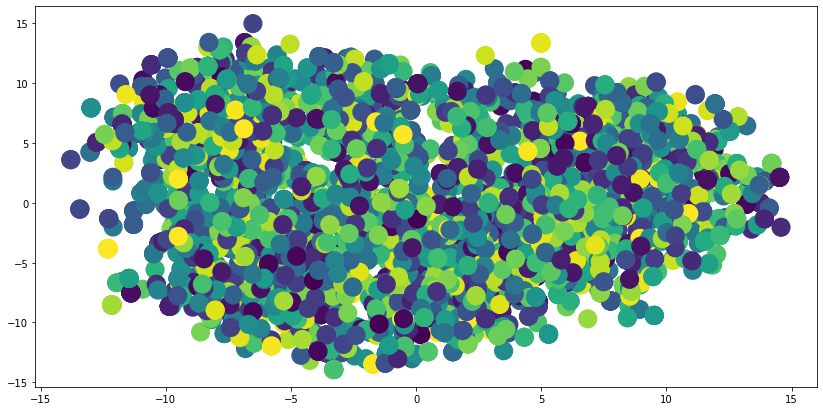

In [177]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=fitted_2  , s=200, cmap='viridis', linewidths=5)


In [178]:
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels_2 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels_2 , metric='euclidean'))


calinski harabasz score of model on train data:  3.213271269097727
silhouette score of model on train data:  0.008966362173701994


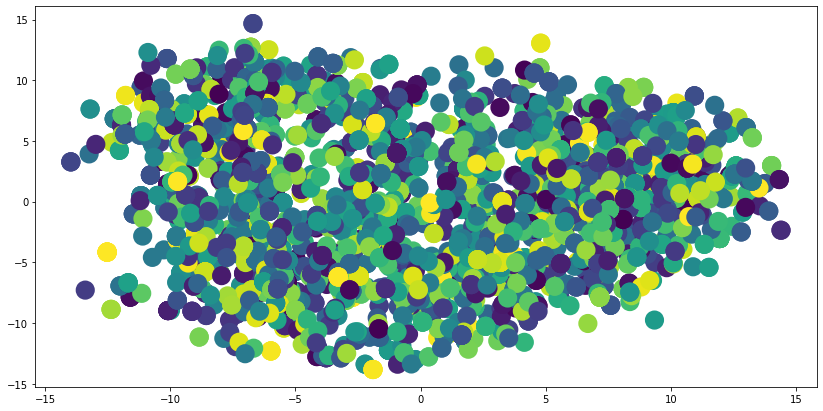

In [179]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels_2 , s=200, cmap='viridis', linewidths=5)


In [180]:
with open('gm_800_all_mpnet_basev2_random_init.pickle', 'wb') as f:
    pickle.dump(gmm_all_mpnet_basev2_2, f)

In [181]:
#k-means elbow gives 1001 for clusters
gmm_all_mpnet_basev2_3 = GaussianMixture(n_components=1001, covariance_type='full', random_state=0).fit(principalComponents_all_mpnet_basev2)
fitted_3 = gmm_all_mpnet_basev2_3.predict(principalComponents_all_mpnet_basev2)
labels_3 = gmm_all_mpnet_basev2_3.predict(principalComponents_all_mpnet_basev2_test)
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,fitted_3 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, fitted_3, metric='euclidean'))


calinski harabasz score of model on train data:  39.596128052099104
silhouette score of model on train data:  0.651308068579658


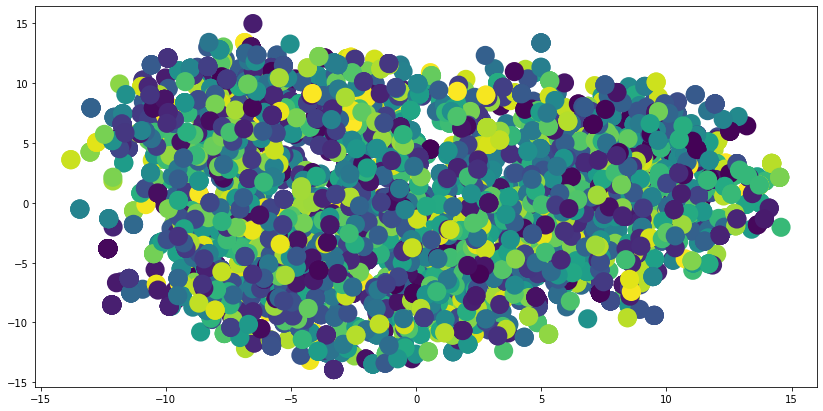

In [182]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=fitted_3 , s=200, cmap='viridis', linewidths=5)


In [183]:
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels_3 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels_3 , metric='euclidean'))


calinski harabasz score of model on train data:  14.931129411466303
silhouette score of model on train data:  0.5288385595446371


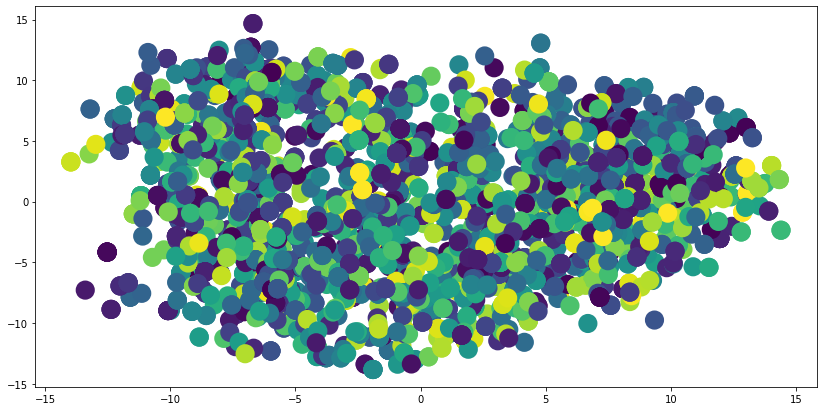

In [184]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels_3 , s=200, cmap='viridis', linewidths=5)


In [185]:
with open('gm_1001_all_mpnet_basev2_.pickle', 'wb') as f:
    pickle.dump(gmm_all_mpnet_basev2_3, f)

In [10]:
#k-means elbow gives 1001 for clusters
gmm_all_mpnet_basev2_4 = GaussianMixture(n_components=1001, covariance_type='full', random_state=0, init_params="random").fit(principalComponents_all_mpnet_basev2)
fitted_4 = gmm_all_mpnet_basev2_4.predict(principalComponents_all_mpnet_basev2)
labels_4 = gmm_all_mpnet_basev2_4.predict(principalComponents_all_mpnet_basev2_test)
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2,fitted_4 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, fitted_4 , metric='euclidean'))


calinski harabasz score of model on train data:  4.410108919474457
silhouette score of model on train data:  -0.019616329573227623


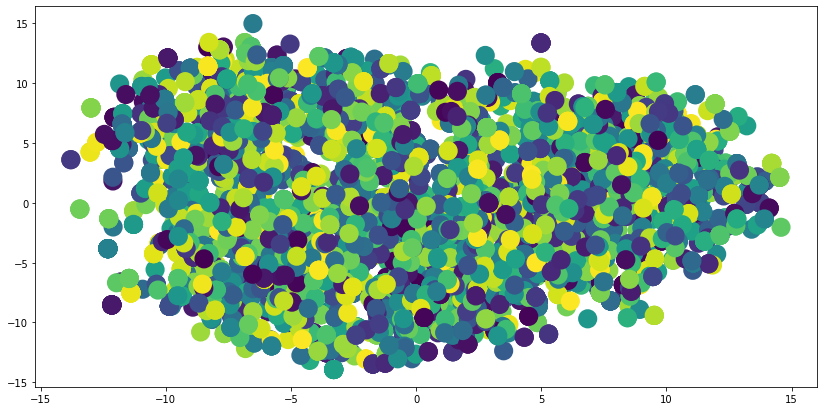

In [11]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=fitted_4 , s=200, cmap='viridis', linewidths=5)


In [12]:
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels_4 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels_4 , metric='euclidean'))


calinski harabasz score of model on train data:  3.552603007773168
silhouette score of model on train data:  0.053015725847701846


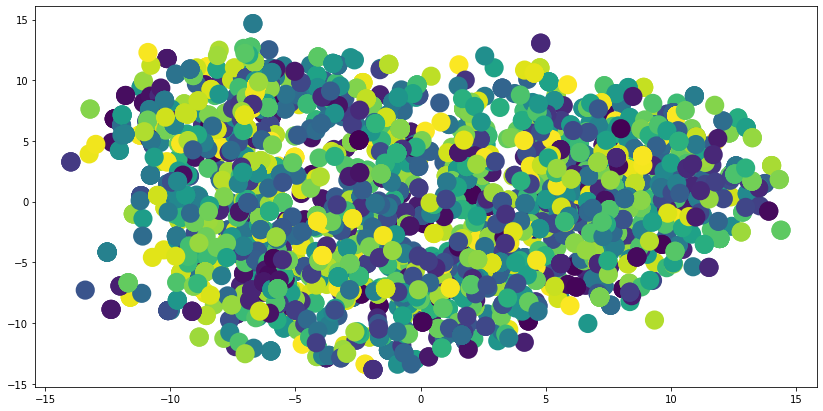

In [13]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels_4 , s=200, cmap='viridis', linewidths=5)


In [14]:
with open('gm_1001_all_mpnet_basev2_random_init.pickle', 'wb') as f:
    pickle.dump(gmm_all_mpnet_basev2_4, f)

In [15]:
gmm_all_mpnet_basev2_5 = GaussianMixture(n_components=2000, covariance_type='full', random_state=0).fit(principalComponents_all_mpnet_basev2)
fitted_5 = gmm_all_mpnet_basev2_5.predict(principalComponents_all_mpnet_basev2)
labels_5 = gmm_all_mpnet_basev2_5.predict(principalComponents_all_mpnet_basev2_test)
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2, fitted_5 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2, fitted_5 , metric='euclidean'))


calinski harabasz score of model on train data:  164.07884838894626
silhouette score of model on train data:  0.8520805098911399


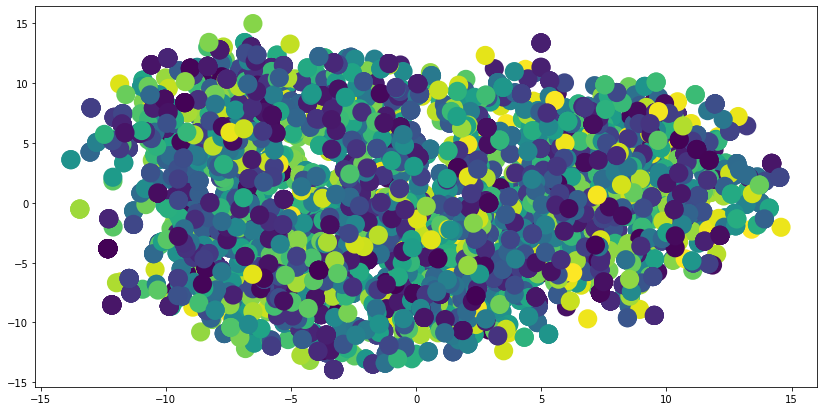

In [16]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2.iloc[:, 0], principalComponents_all_mpnet_basev2.iloc[:, 1], c=fitted_5 , s=200, cmap='viridis', linewidths=5)


In [17]:
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_mpnet_basev2_test,labels_5 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_mpnet_basev2_test, labels_5 , metric='euclidean'))


calinski harabasz score of model on train data:  29.809231427540485
silhouette score of model on train data:  0.6651573569929154


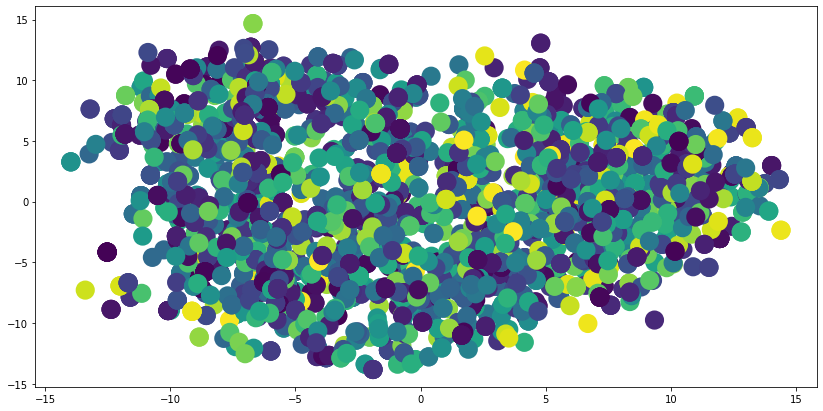

In [18]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_mpnet_basev2_test.iloc[:, 0], principalComponents_all_mpnet_basev2_test.iloc[:, 1], c=labels_5 , s=200, cmap='viridis', linewidths=5)


In [19]:
with open('gm_2000_all_mpnet_basev2.pickle', 'wb') as f:
    pickle.dump(gmm_all_mpnet_basev2_5, f)

### Model : paraphrase-MiniLM-L3-v2

In [20]:
gmm_all_minilm_l3v2 = GaussianMixture(n_components=800, covariance_type='full', random_state=0).fit(principalComponents_all_minilm_l3v2)
fitted = gmm_all_minilm_l3v2.predict(principalComponents_all_minilm_l3v2)
labels = gmm_all_minilm_l3v2.predict(principalComponents_all_minilm_l3v2_test)
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2, fitted ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, fitted , metric='euclidean'))


calinski harabasz score of model on train data:  28.26853818618169
silhouette score of model on train data:  0.5764810962960004


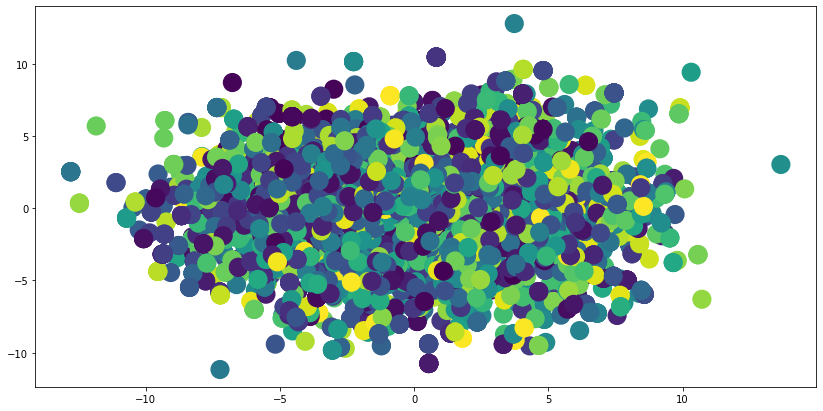

In [21]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=fitted , s=200, cmap='viridis', linewidths=5)


In [22]:
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels , metric='euclidean'))


calinski harabasz score of model on train data:  10.038354433686573
silhouette score of model on train data:  0.4736784395232224


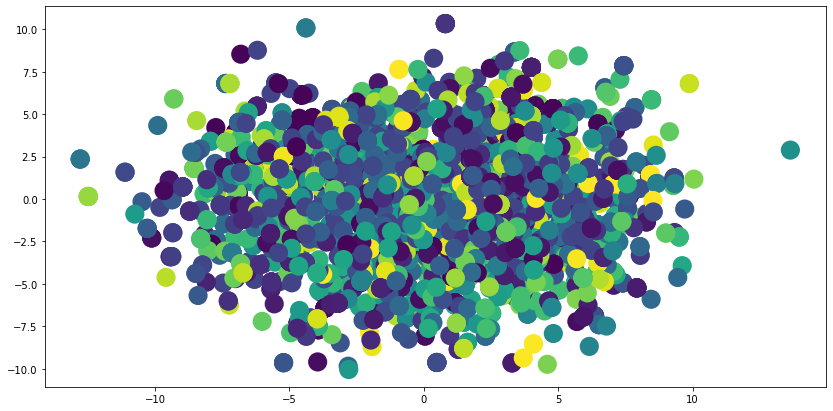

In [23]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels , s=200, cmap='viridis', linewidths=5)


In [26]:
with open('gm_800_all_minilm_l3v2.pickle', 'wb') as f:
    pickle.dump(gmm_all_minilm_l3v2, f)

In [27]:
gmm_all_minilm_l3v2_2 = GaussianMixture(n_components=800, covariance_type='full', random_state=0, init_params='random').fit(principalComponents_all_minilm_l3v2)
fitted_2 = gmm_all_minilm_l3v2_2.predict(principalComponents_all_minilm_l3v2)
labels_2 = gmm_all_minilm_l3v2_2.predict(principalComponents_all_minilm_l3v2_test)
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,fitted_2 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, fitted_2  , metric='euclidean'))


calinski harabasz score of model on train data:  4.455745557025404
silhouette score of model on train data:  0.06577814908647857


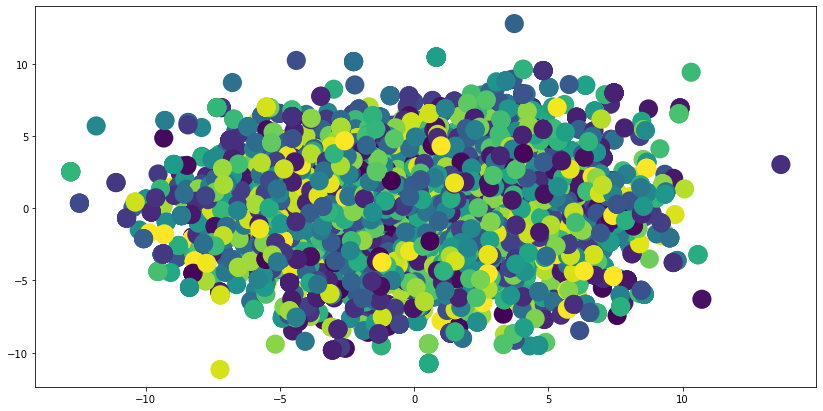

In [28]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=fitted_2  , s=200, cmap='viridis', linewidths=5)


In [29]:
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels_2 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels_2 , metric='euclidean'))


calinski harabasz score of model on train data:  3.341580427823991
silhouette score of model on train data:  0.12257514495644466


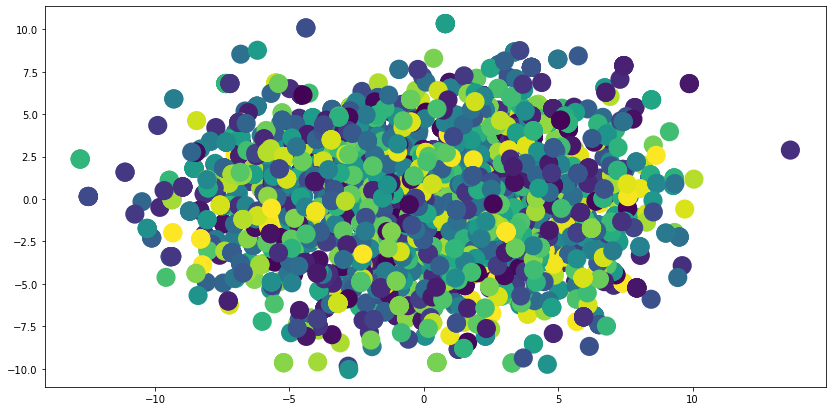

In [30]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels_2 , s=200, cmap='viridis', linewidths=5)


In [31]:
with open('gm_800_all_minilm_l3v2_random_init.pickle', 'wb') as f:
    pickle.dump(gmm_all_minilm_l3v2_2, f)

In [32]:
gmm_all_minilm_l3v2_3 = GaussianMixture(n_components=1001, covariance_type='full', random_state=0).fit(principalComponents_all_minilm_l3v2)
fitted_3 = gmm_all_minilm_l3v2_3.predict(principalComponents_all_minilm_l3v2)
labels_3 = gmm_all_minilm_l3v2_3.predict(principalComponents_all_minilm_l3v2_test)
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,fitted_3 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, fitted_3, metric='euclidean'))


calinski harabasz score of model on train data:  31.10994215193265
silhouette score of model on train data:  0.6551210624543397


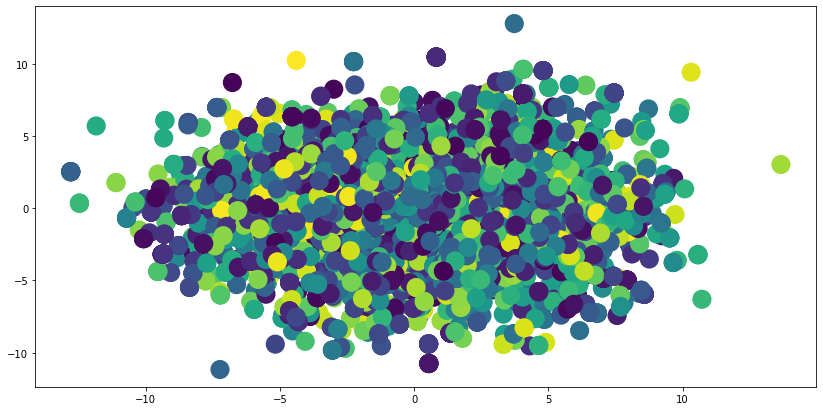

In [33]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=fitted_3 , s=200, cmap='viridis', linewidths=5)


In [34]:
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels_3 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels_3 , metric='euclidean'))


calinski harabasz score of model on train data:  10.779038019669764
silhouette score of model on train data:  0.5213066748878288


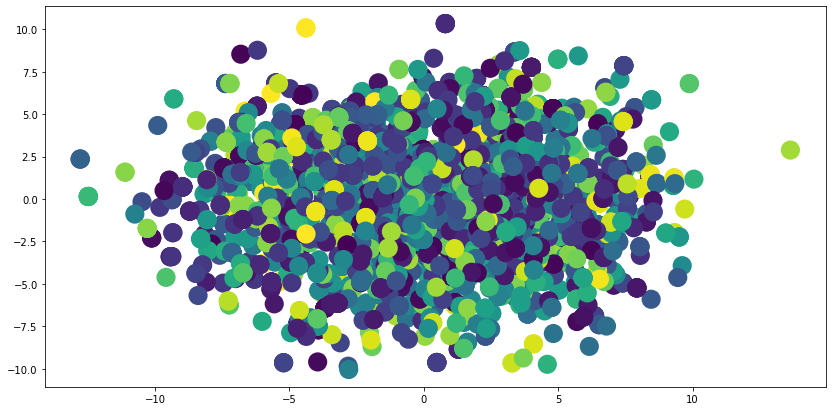

In [35]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels_3 , s=200, cmap='viridis', linewidths=5)


In [36]:
with open('gm_1001_all_minilm_l3v2_.pickle', 'wb') as f:
    pickle.dump(gmm_all_minilm_l3v2_3, f)

In [37]:
#k-means elbow gives 1001 for clusters
gmm_all_minilm_l3v2_4 = GaussianMixture(n_components=1001, covariance_type='full', random_state=0, init_params="random").fit(principalComponents_all_minilm_l3v2)
fitted_4 = gmm_all_minilm_l3v2_4.predict(principalComponents_all_minilm_l3v2)
labels_4 = gmm_all_minilm_l3v2_4.predict(principalComponents_all_minilm_l3v2_test)
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2,fitted_4 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2, fitted_4 , metric='euclidean'))


calinski harabasz score of model on train data:  4.488790137829247
silhouette score of model on train data:  0.10774187484925789


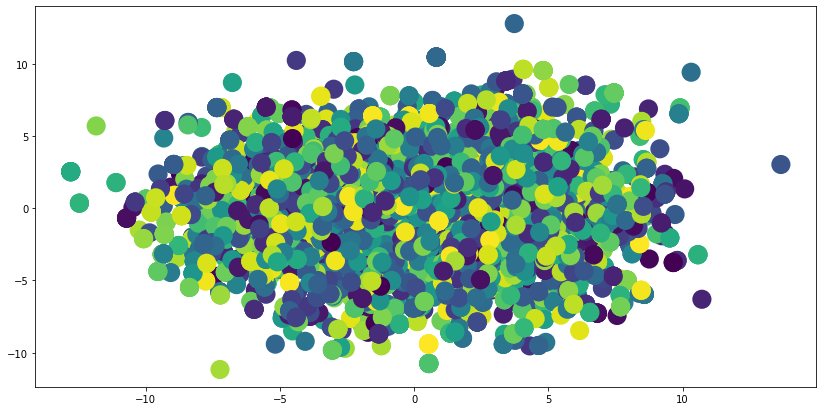

In [38]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2.iloc[:, 0], principalComponents_all_minilm_l3v2.iloc[:, 1], c=fitted_4 , s=200, cmap='viridis', linewidths=5)


In [39]:
print("calinski harabasz score of model on train data: ", metrics.calinski_harabasz_score(principalComponents_all_minilm_l3v2_test,labels_4 ))
print("silhouette score of model on train data: " , metrics.silhouette_score(principalComponents_all_minilm_l3v2_test, labels_4 , metric='euclidean'))


calinski harabasz score of model on train data:  3.527559605619638
silhouette score of model on train data:  0.15579722337590562


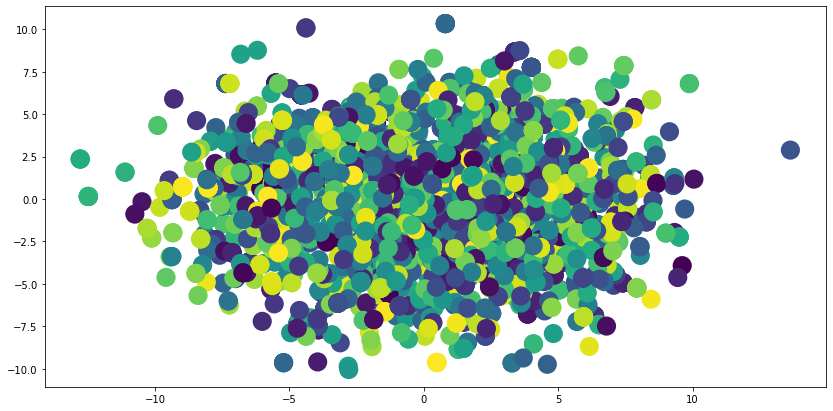

In [40]:
plt.figure(figsize=(14, 7))
plt.scatter(principalComponents_all_minilm_l3v2_test.iloc[:, 0], principalComponents_all_minilm_l3v2_test.iloc[:, 1], c=labels_4 , s=200, cmap='viridis', linewidths=5)


In [41]:
with open('gm_1001_all_minilm_l3v2_random_init.pickle', 'wb') as f:
    pickle.dump(gmm_all_minilm_l3v2_4, f)